## Authored by Amirul Uzair

# Load Dependencies

In [1]:
#load libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import pyplot
from pandas import read_csv
from pandas import set_option
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import Binarizer
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from pandas import read_csv
from sklearn.decomposition import PCA
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import ShuffleSplit
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

print("All dependencies imported successfully")

All dependencies imported successfully


# Read Dataset

In [2]:
df = pd.read_csv(r"C:\Users\amiru\Desktop\Data Scientist Final Project\Dataset Acquisitions\breast-cancer.csv")
df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [3]:
# Reordering the columns to move 'Diagnosis' to the rightmost position
cols = [col for col in df.columns if col != 'diagnosis'] + ['diagnosis']
df = df[cols]

# Display the updated DataFrame
df

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,842302,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,M
1,842517,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,M
2,84300903,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,M
3,84348301,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,M
4,84358402,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,M
565,926682,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,M
566,926954,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,M
567,927241,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,M


# Data Exploration

In [4]:
df.head()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,842302,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,M
1,842517,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,M
2,84300903,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,M
3,84348301,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,M
4,84358402,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,M


In [5]:
df.tail()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis
564,926424,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,M
565,926682,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,M
566,926954,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,M
567,927241,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,M
568,92751,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,0.1587,...,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039,B


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

# Data Cleaning

## Drop Unique ID for Analysis

In [7]:
df = df.drop(columns="id")
df

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,M
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,M
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,M
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,M
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,M
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,M
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,M
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,M


# Feature Distribution

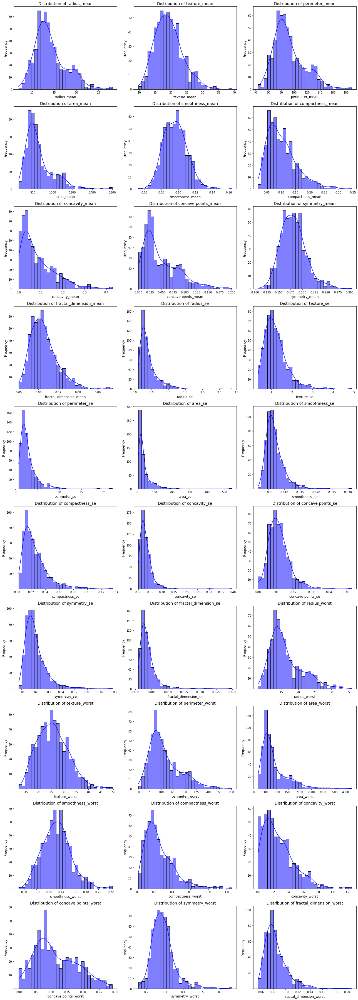

In [8]:
import seaborn as sns

df_features = df.iloc[:, :-1]

# Visualize the distribution of all features except the target
def plot_distributions(df, cols_per_row=3):
    num_cols = len(df.columns)
    num_rows = (num_cols // cols_per_row) + int(num_cols % cols_per_row > 0)

    plt.figure(figsize=(cols_per_row * 6, num_rows * 5))
    for i, column in enumerate(df.columns, 1):
        plt.subplot(num_rows, cols_per_row, i)
        sns.histplot(df[column], kde=True, bins=30, color='blue', edgecolor='black')
        plt.title(f"Distribution of {column}", fontsize=14)  # Increased title font size
        plt.xlabel(column, fontsize=12)  # Increased x-label font size
        plt.ylabel("Frequency", fontsize=12)  # Increased y-label font size
        plt.tight_layout()
    plt.show()

# Call the function to plot distributions
plot_distributions(df_features, cols_per_row=3)

# Feature Relationship with Diagnosis Class

## Box Plot

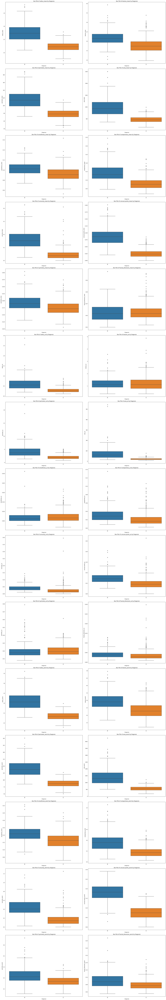

In [9]:
# Plotting boxplots for all numeric features by diagnosis
plt.figure(figsize=(25, 150))
numeric_features = df.select_dtypes(include='number').columns

for i, feature in enumerate(numeric_features, 1):
    plt.subplot((len(numeric_features) + 1) // 2, 2, i)
    sns.boxplot(data=df, x="diagnosis", y=feature)
    plt.title(f'Box Plot of {feature} by Diagnosis')
    plt.xlabel('Diagnosis')
    plt.ylabel(feature)

plt.tight_layout()
plt.show()

## Histogram

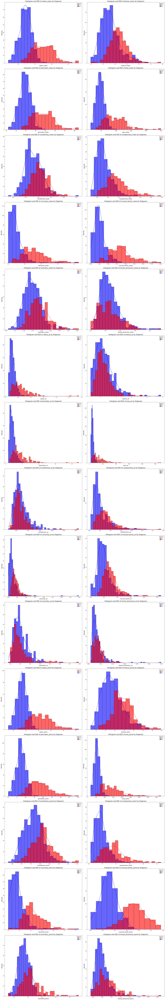

In [10]:
# Plotting histograms with KDE for all numeric features by diagnosis
plt.figure(figsize=(25, 150))
numeric_features = df.select_dtypes(include='number').columns

for i, feature in enumerate(numeric_features, 1):
    plt.subplot((len(numeric_features) + 1) // 2, 2, i)
    sns.histplot(data=df, x=feature, hue="diagnosis", kde=True, palette={"M": "red", "B": "blue"}, alpha=0.6)
    plt.title(f'Histogram and KDE of {feature} by Diagnosis', fontsize=16)
    plt.xlabel(feature, fontsize=14)
    plt.ylabel('Density', fontsize=14)

plt.tight_layout()
plt.show()

## Scatter Plot

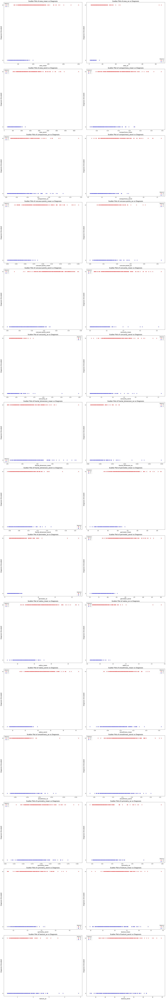

In [11]:
# Plotting scatter plots for all numeric features against the diagnosis
plt.figure(figsize=(25, 150))
numeric_features = df.select_dtypes(include='number').columns.difference(["diagnosis"])

for i, feature in enumerate(numeric_features, 1):
    plt.subplot((len(numeric_features) + 1) // 2, 2, i)
    sns.scatterplot(data=df, x=feature, y="diagnosis", hue="diagnosis", palette={"M": "red", "B": "blue"})
    plt.title(f'Scatter Plot of {feature} vs Diagnosis', fontsize=16)
    plt.xlabel(feature, fontsize=14)
    plt.ylabel('Diagnosis (Encoded)', fontsize=14)

plt.tight_layout()
plt.show()

## Violin Plot

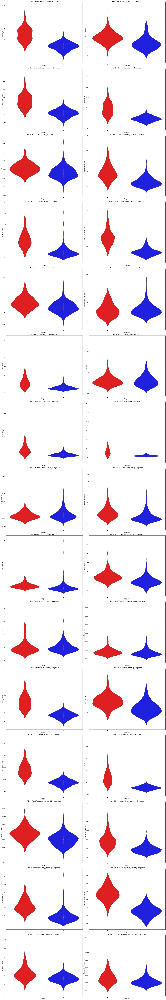

In [12]:
# Plotting violin plots for all numeric features by diagnosis
plt.figure(figsize=(25, 150))
numeric_features = df.select_dtypes(include='number').columns

for i, feature in enumerate(numeric_features, 1):
    plt.subplot((len(numeric_features) + 1) // 2, 2, i)
    sns.violinplot(data=df, x="diagnosis", y=feature, palette={"M": "red", "B": "blue"})
    plt.title(f'Violin Plot of {feature} by Diagnosis', fontsize=16)
    plt.xlabel("Diagnosis", fontsize=14)
    plt.ylabel(feature, fontsize=14)

plt.tight_layout()
plt.show()

## Checking for Outliers

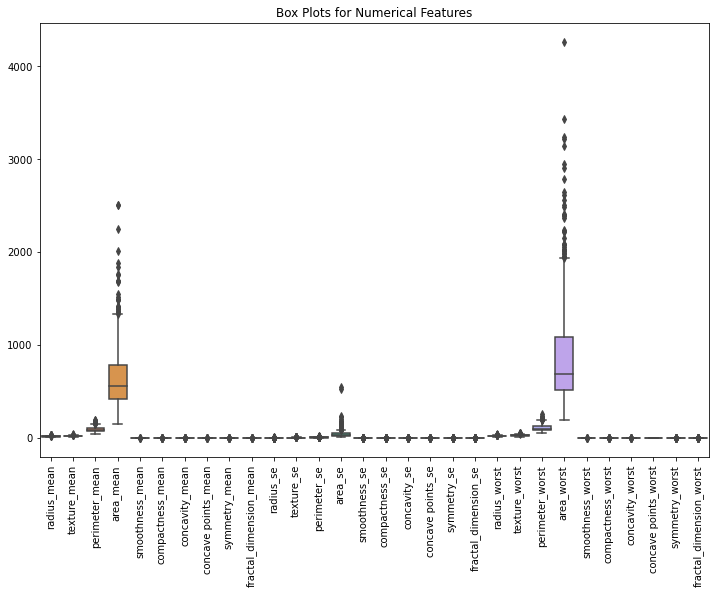

In [13]:
import seaborn as sns

# Plot boxplots for numerical columns
plt.figure(figsize=(12, 8))
sns.boxplot(data=df)
plt.xticks(rotation=90)
plt.title('Box Plots for Numerical Features')
plt.show()

## Verify Outliers Using IQR

In [14]:
# Loop through all columns except target label
for column in df.columns:
    if column != 'diagnosis':
        # Calculate Q1, Q3, and IQR for each column
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1

        # Define the outlier thresholds
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Check for outliers
        outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]

        # Print if no outliers are found for the column
        if outliers.empty:
            print(f"No outliers detected in {column}")
        else:
            print(f"Outliers detected in {column}:")
            print(outliers[[column]])

Outliers detected in radius_mean:
     radius_mean
82         25.22
108        22.27
122        24.25
164        23.27
180        27.22
202        23.29
212        28.11
236        23.21
339        23.51
352        25.73
369        22.01
461        27.42
503        23.09
521        24.63
Outliers detected in texture_mean:
     texture_mean
219         32.47
232         33.81
239         39.28
259         33.56
265         31.12
455         30.72
562         30.62
Outliers detected in perimeter_mean:
     perimeter_mean
82            171.5
108           152.8
122           166.2
164           152.1
180           182.1
202           158.9
212           188.5
236           153.5
339           155.1
352           174.2
461           186.9
503           152.1
521           165.5
Outliers detected in area_mean:
     area_mean
23      1404.0
82      1878.0
108     1509.0
122     1761.0
164     1686.0
180     2250.0
202     1685.0
212     2499.0
236     1670.0
250     1364.0
265     1419.0
272

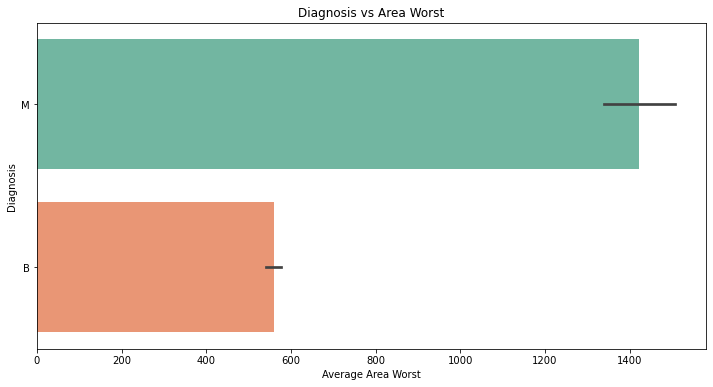

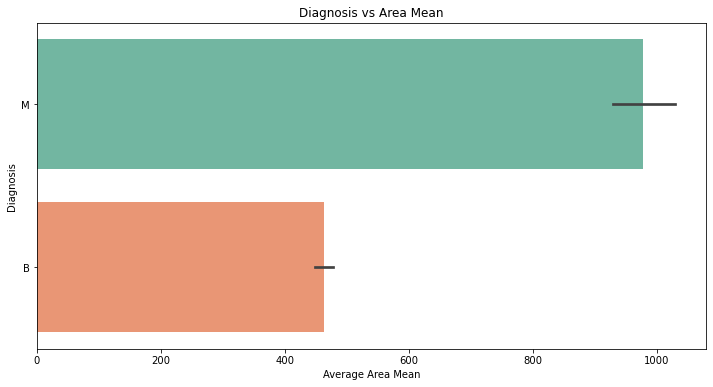

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot Diagnosis vs area_worst (Horizontal Bar Plot)
plt.figure(figsize=(12, 6))
sns.barplot(x='area_worst', y='diagnosis', data=df, palette='Set2')
plt.title('Diagnosis vs Area Worst')
plt.xlabel('Average Area Worst')
plt.ylabel('Diagnosis')
plt.show()

# Plot Diagnosis vs area_mean (Horizontal Bar Plot)
plt.figure(figsize=(12, 6))
sns.barplot(x='area_mean', y='diagnosis', data=df, palette='Set2')
plt.title('Diagnosis vs Area Mean')
plt.xlabel('Average Area Mean')
plt.ylabel('Diagnosis')
plt.show()

## Handle Outliers using IQR

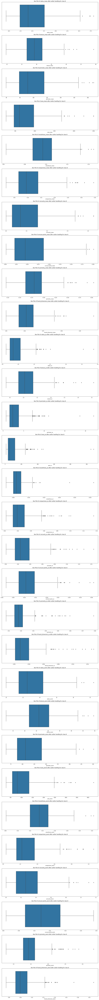

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define a function to handle outliers using the IQR method for class 'B'
def handle_outliers_iqr_class_b(data, column, factor=1.5, class_column='diagnosis'):
    # Filter data for class 'B'
    class_b_data = data[data[class_column] == 'B']
    
    # Apply the IQR outlier handling only to class 'B'
    Q1 = class_b_data[column].quantile(0.25)
    Q3 = class_b_data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - factor * IQR
    upper_bound = Q3 + factor * IQR
    
    # Remove outliers for class 'B'
    class_b_data = class_b_data[(class_b_data[column] >= lower_bound) & (class_b_data[column] <= upper_bound)]
    
    # Merge the cleaned class 'B' data back with other data
    data_cleaned = pd.concat([data[data[class_column] != 'B'], class_b_data])
    
    return data_cleaned

# Apply the function to all numeric columns except the last column, and only for class 'B'
numeric_columns = df.select_dtypes(include=['number']).columns[:-1]  # Exclude the last column
for column in numeric_columns:
    df = handle_outliers_iqr_class_b(df, column=column)

# Reset the index after removing outliers
df = df.reset_index(drop=True)

# Verify the changes for all numeric columns
plt.figure(figsize=(15, len(df.select_dtypes(include=['number']).columns) * 5))
for i, column in enumerate(df.select_dtypes(include=['number']).columns, 1):
    plt.subplot(len(df.select_dtypes(include=['number']).columns), 1, i)
    sns.boxplot(x=df[column])
    plt.title(f'Box Plot of {column} after outlier handling for class B')
    plt.xlabel(column)

plt.tight_layout()
plt.show()


## Boxplot for Cleaned Data after Handling Outliers

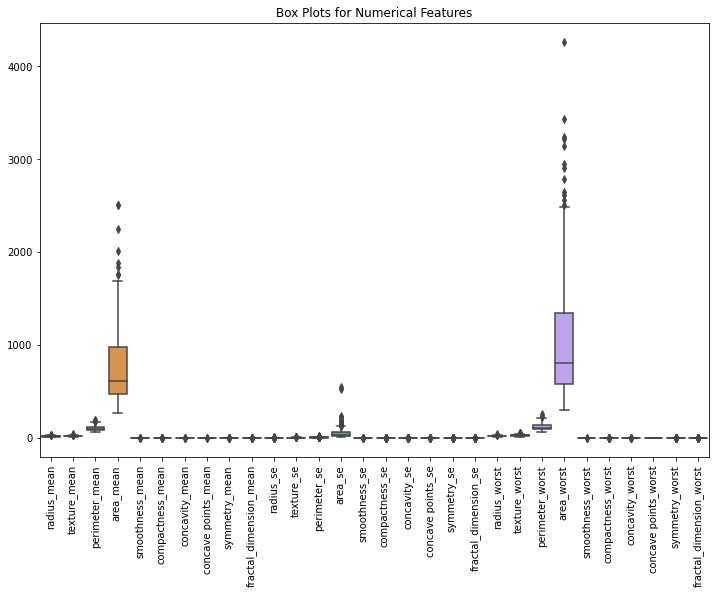

In [17]:
# Plot boxplots for numerical columns
plt.figure(figsize=(12, 8))
sns.boxplot(data=df)
plt.xticks(rotation=90)
plt.title('Box Plots for Numerical Features')
plt.show()

## Scatter Plot of Cleaned Feature vs Diagnosis 

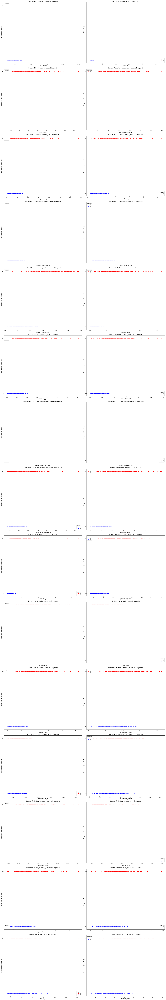

In [18]:
# Plotting scatter plots for all numeric features against the diagnosis
plt.figure(figsize=(25, 150))
numeric_features = df.select_dtypes(include='number').columns.difference(["diagnosis"])

for i, feature in enumerate(numeric_features, 1):
    plt.subplot((len(numeric_features) + 1) // 2, 2, i)
    sns.scatterplot(data=df, x=feature, y="diagnosis", hue="diagnosis", palette={"M": "red", "B": "blue"})
    plt.title(f'Scatter Plot of {feature} vs Diagnosis', fontsize=16)
    plt.xlabel(feature, fontsize=14)
    plt.ylabel('Diagnosis (Encoded)', fontsize=14)

plt.tight_layout()
plt.show()

## Histogram of Cleaned Feature vs Diagnosis

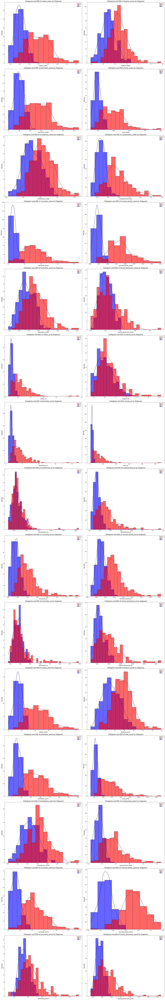

In [19]:
# Plotting histograms with KDE for all numeric features by diagnosis
plt.figure(figsize=(25, 150))
numeric_features = df.select_dtypes(include='number').columns

for i, feature in enumerate(numeric_features, 1):
    plt.subplot((len(numeric_features) + 1) // 2, 2, i)
    sns.histplot(data=df, x=feature, hue="diagnosis", kde=True, palette={"M": "red", "B": "blue"}, alpha=0.6)
    plt.title(f'Histogram and KDE of {feature} by Diagnosis', fontsize=16)
    plt.xlabel(feature, fontsize=14)
    plt.ylabel('Density', fontsize=14)

plt.tight_layout()
plt.show()

## Boxplot of Cleaned Feature vs Diagnosis

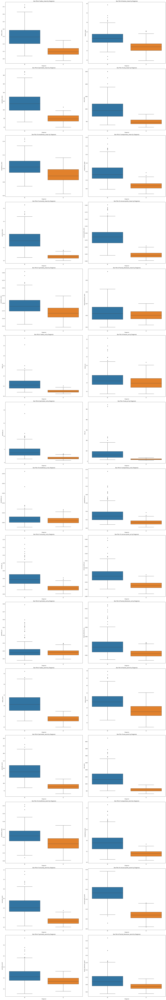

In [20]:
# Plotting boxplots for all numeric features by diagnosis
plt.figure(figsize=(25, 150))
numeric_features = df.select_dtypes(include='number').columns

for i, feature in enumerate(numeric_features, 1):
    plt.subplot((len(numeric_features) + 1) // 2, 2, i)
    sns.boxplot(data=df, x="diagnosis", y=feature)
    plt.title(f'Box Plot of {feature} by Diagnosis')
    plt.xlabel('Diagnosis')
    plt.ylabel(feature)

plt.tight_layout()
plt.show()

In [21]:
df

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,17.990,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.147100,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.66560,0.71190,0.26540,0.4601,0.11890,M
1,20.570,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.070170,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.18660,0.24160,0.18600,0.2750,0.08902,M
2,19.690,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.127900,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.42450,0.45040,0.24300,0.3613,0.08758,M
3,11.420,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.105200,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.86630,0.68690,0.25750,0.6638,0.17300,M
4,20.290,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.104300,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.20500,0.40000,0.16250,0.2364,0.07678,M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
393,13.870,20.70,89.77,584.8,0.09578,0.10180,0.03688,0.023690,0.1620,0.06688,...,24.75,99.17,688.6,0.1264,0.20370,0.13770,0.06845,0.2249,0.08492,B
394,13.620,23.23,87.19,573.2,0.09246,0.06747,0.02974,0.024430,0.1664,0.05801,...,29.09,97.58,729.8,0.1216,0.15170,0.10490,0.07174,0.2642,0.06953,B
395,10.320,16.35,65.31,324.9,0.09434,0.04994,0.01012,0.005495,0.1885,0.06201,...,21.77,71.12,384.9,0.1285,0.08842,0.04384,0.02381,0.2681,0.07399,B
396,9.683,19.34,61.05,285.7,0.08491,0.05030,0.02337,0.009615,0.1580,0.06235,...,25.59,69.10,364.2,0.1199,0.09546,0.09350,0.03846,0.2552,0.07920,B


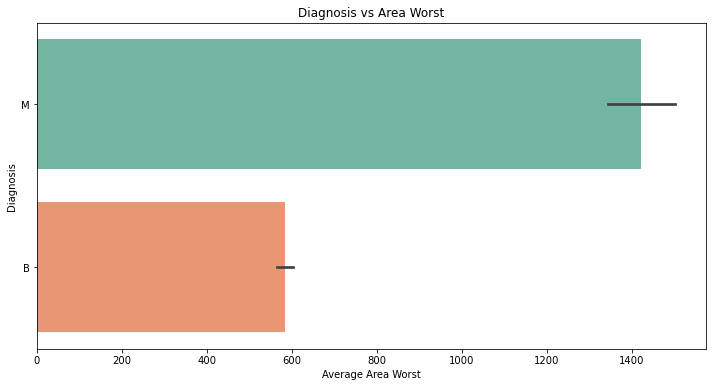

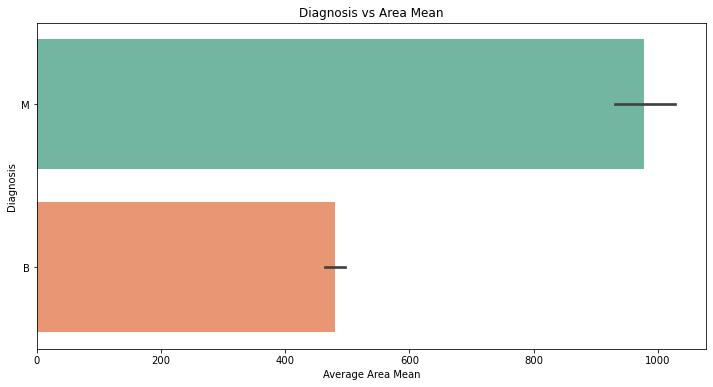

In [22]:
# Plot Diagnosis vs area_worst (Horizontal Bar Plot)
plt.figure(figsize=(12, 6))
sns.barplot(x='area_worst', y='diagnosis', data=df, palette='Set2')
plt.title('Diagnosis vs Area Worst')
plt.xlabel('Average Area Worst')
plt.ylabel('Diagnosis')
plt.show()

# Plot Diagnosis vs area_mean (Horizontal Bar Plot)
plt.figure(figsize=(12, 6))
sns.barplot(x='area_mean', y='diagnosis', data=df, palette='Set2')
plt.title('Diagnosis vs Area Mean')
plt.xlabel('Average Area Mean')
plt.ylabel('Diagnosis')
plt.show()

# Class Distribution

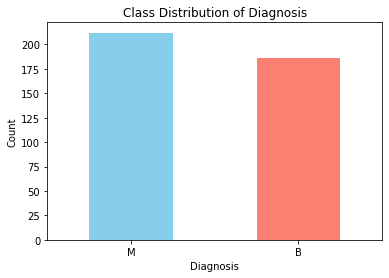

In [23]:
df['diagnosis'].value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Class Distribution of Diagnosis')
plt.xlabel('Diagnosis')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()

# Feature Distribution

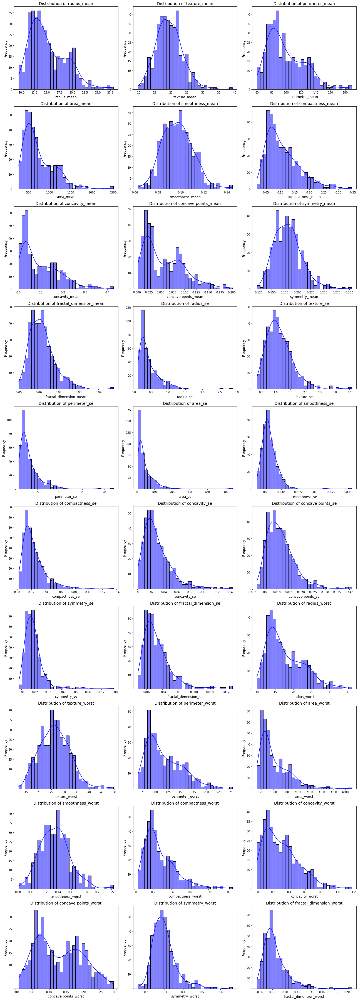

In [24]:
df_features = df.iloc[:, :-1]

# Visualize the distribution of all features except the target
def plot_distributions(df, cols_per_row=3):
    num_cols = len(df.columns)
    num_rows = (num_cols // cols_per_row) + int(num_cols % cols_per_row > 0)

    plt.figure(figsize=(cols_per_row * 6, num_rows * 5))
    for i, column in enumerate(df.columns, 1):
        plt.subplot(num_rows, cols_per_row, i)
        sns.histplot(df[column], kde=True, bins=30, color='blue', edgecolor='black')
        plt.title(f"Distribution of {column}", fontsize=14)  # Increased title font size
        plt.xlabel(column, fontsize=12)  # Increased x-label font size
        plt.ylabel("Frequency", fontsize=12)  # Increased y-label font size
        plt.tight_layout()
    plt.show()

# Call the function to plot distributions
plot_distributions(df_features, cols_per_row=3)

# Descriptive Statistical Analysis

In [25]:
df.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,...,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000
mean,15.105593,19.507538,98.604849,745.642462,0.097125,0.108891,0.099952,0.056890,0.181779,0.061607,...,17.668580,26.340176,116.709121,1030.277387,0.135238,0.272603,0.300942,0.129647,0.298983,0.083908
std,3.566120,4.111374,24.782040,373.200818,0.013321,0.057026,0.085755,0.042206,0.026973,0.006273,...,4.959692,5.988480,34.725749,611.258743,0.022246,0.170195,0.213836,0.067980,0.065345,0.018636
min,9.397000,9.710000,59.750000,268.800000,0.062510,0.019380,0.000692,0.001852,0.121500,0.049960,...,9.965000,12.020000,65.130000,301.000000,0.081250,0.034320,0.001845,0.009259,0.156500,0.055040
25%,12.340000,16.685000,79.027500,468.650000,0.087452,0.065888,0.029792,0.021157,0.161925,0.056810,...,13.725000,21.855000,88.580000,577.675000,0.119900,0.155025,0.135000,0.070587,0.255450,0.071462
50%,14.085000,19.265000,91.495000,610.300000,0.096970,0.094695,0.070835,0.045295,0.180000,0.060855,...,16.225000,26.080000,106.300000,807.900000,0.134800,0.219150,0.263100,0.121700,0.286250,0.079505
75%,17.592500,21.907500,115.800000,976.300000,0.105400,0.138450,0.155025,0.087308,0.195675,0.064747,...,20.960000,30.405000,140.800000,1341.000000,0.149350,0.366775,0.420450,0.183700,0.323025,0.091838
max,28.110000,39.280000,188.500000,2501.000000,0.144700,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.170000,0.291000,0.663800,0.207500


## Measuring Central Tendency

In [26]:
# Select column
columns_to_analyze = df.columns[:-1]

# Calculate mean, median, and mode for each column
mean_values = df[columns_to_analyze].mean()
median_values = df[columns_to_analyze].median()
mode_values = df[columns_to_analyze].mode().iloc[0]

# Display the results
print("Mean values for features:")
print(mean_values)
print("\nMedian values for features:")
print(median_values)
print("\nMode values for features:")
print(mode_values)

Mean values for features:
radius_mean                  15.105593
texture_mean                 19.507538
perimeter_mean               98.604849
area_mean                   745.642462
smoothness_mean               0.097125
compactness_mean              0.108891
concavity_mean                0.099952
concave points_mean           0.056890
symmetry_mean                 0.181779
fractal_dimension_mean        0.061607
radius_se                     0.440447
texture_se                    1.119803
perimeter_se                  3.101853
area_se                      47.570387
smoothness_se                 0.006454
compactness_se                0.023750
concavity_se                  0.029517
concave points_se             0.011659
symmetry_se                   0.019332
fractal_dimension_se          0.003311
radius_worst                 17.668580
texture_worst                26.340176
perimeter_worst             116.709121
area_worst                 1030.277387
smoothness_worst              0.135238

## Measures of Variability

In [27]:
# Select only numerical columns from the DataFrame
numerical_columns = df.select_dtypes(include=['number']).columns

# Calculate standard deviation, variance, and range for each numerical column
std_values = df[numerical_columns].std()
variance_values = df[numerical_columns].var()
range_values = df[numerical_columns].max() - df[numerical_columns].min()

# Display the results
print("Standard Deviation values for numerical features:")
print(std_values)
print("\nVariance values for numerical features:")
print(variance_values)
print("\nRange values for numerical features:")
print(range_values)

Standard Deviation values for numerical features:
radius_mean                  3.566120
texture_mean                 4.111374
perimeter_mean              24.782040
area_mean                  373.200818
smoothness_mean              0.013321
compactness_mean             0.057026
concavity_mean               0.085755
concave points_mean          0.042206
symmetry_mean                0.026973
fractal_dimension_mean       0.006273
radius_se                    0.313455
texture_se                   0.448896
perimeter_se                 2.307314
area_se                     52.314800
smoothness_se                0.002465
compactness_se               0.016707
concavity_se                 0.021260
concave points_se            0.005704
symmetry_se                  0.007978
fractal_dimension_se         0.001783
radius_worst                 4.959692
texture_worst                5.988480
perimeter_worst             34.725749
area_worst                 611.258743
smoothness_worst             0.022246


## Measurement of Skewness

In [28]:
# Summary statistics for all numeric columns
print("Summary Statistics for Numeric Columns:")
print(df.describe())

# Check skewness for all numeric columns
from scipy.stats import skew

print("\nSkewness for All Numeric Columns:")
skewness = df.select_dtypes(include=['number']).apply(skew)
print(skewness)

Summary Statistics for Numeric Columns:
       radius_mean  texture_mean  perimeter_mean    area_mean  \
count   398.000000    398.000000      398.000000   398.000000   
mean     15.105593     19.507538       98.604849   745.642462   
std       3.566120      4.111374       24.782040   373.200818   
min       9.397000      9.710000       59.750000   268.800000   
25%      12.340000     16.685000       79.027500   468.650000   
50%      14.085000     19.265000       91.495000   610.300000   
75%      17.592500     21.907500      115.800000   976.300000   
max      28.110000     39.280000      188.500000  2501.000000   

       smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
count       398.000000        398.000000      398.000000           398.000000   
mean          0.097125          0.108891        0.099952             0.056890   
std           0.013321          0.057026        0.085755             0.042206   
min           0.062510          0.019380        0.

## Density Plot

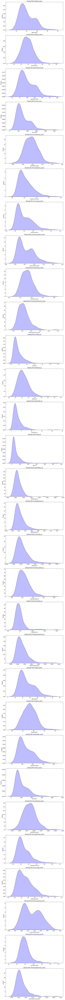

In [29]:
# Select numeric columns
numeric_columns = df.select_dtypes(include=['number']).columns

# Generate density plots for all numeric columns
plt.figure(figsize=(10, len(numeric_columns) * 5))  # Adjust figure size based on the number of columns
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(len(numeric_columns), 1, i)
    sns.kdeplot(df[column], shade=True, color='blue')
    plt.title(f'Density Plot of {column}')
    plt.xlabel(column)
    plt.ylabel('Density')

plt.tight_layout()
plt.show()

# Label Encoding Class

In [30]:
# Label encoding the 'Diagnosis' column: B = 0, M = 1
df['diagnosis'] = df['diagnosis'].map({'B': 0, 'M': 1})

# Display the updated dataframe to verify the change
print(df['diagnosis'].head())

0    1
1    1
2    1
3    1
4    1
Name: diagnosis, dtype: int64


In [31]:
df

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,17.990,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.147100,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.66560,0.71190,0.26540,0.4601,0.11890,1
1,20.570,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.070170,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.18660,0.24160,0.18600,0.2750,0.08902,1
2,19.690,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.127900,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.42450,0.45040,0.24300,0.3613,0.08758,1
3,11.420,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.105200,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.86630,0.68690,0.25750,0.6638,0.17300,1
4,20.290,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.104300,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.20500,0.40000,0.16250,0.2364,0.07678,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
393,13.870,20.70,89.77,584.8,0.09578,0.10180,0.03688,0.023690,0.1620,0.06688,...,24.75,99.17,688.6,0.1264,0.20370,0.13770,0.06845,0.2249,0.08492,0
394,13.620,23.23,87.19,573.2,0.09246,0.06747,0.02974,0.024430,0.1664,0.05801,...,29.09,97.58,729.8,0.1216,0.15170,0.10490,0.07174,0.2642,0.06953,0
395,10.320,16.35,65.31,324.9,0.09434,0.04994,0.01012,0.005495,0.1885,0.06201,...,21.77,71.12,384.9,0.1285,0.08842,0.04384,0.02381,0.2681,0.07399,0
396,9.683,19.34,61.05,285.7,0.08491,0.05030,0.02337,0.009615,0.1580,0.06235,...,25.59,69.10,364.2,0.1199,0.09546,0.09350,0.03846,0.2552,0.07920,0


# Correlation

## Correlation Matrix

In [32]:
df.corr()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis
radius_mean,1.000000,0.433150,0.997554,0.989886,0.231326,0.562763,0.743956,0.834266,0.255376,-0.163193,...,0.329996,0.959005,0.939671,0.116931,0.407936,0.567229,0.730783,0.124826,0.070559,0.706586
texture_mean,0.433150,1.000000,0.442849,0.414682,0.162149,0.391758,0.444276,0.430889,0.224480,0.063906,...,0.906432,0.474965,0.438309,0.228192,0.402749,0.455314,0.448832,0.178871,0.250872,0.545312
perimeter_mean,0.997554,0.442849,1.000000,0.987822,0.276355,0.614710,0.783576,0.864121,0.297915,-0.105740,...,0.341511,0.964933,0.938865,0.155112,0.453092,0.606912,0.760750,0.156129,0.116790,0.722950
area_mean,0.989886,0.414682,0.987822,1.000000,0.230833,0.541310,0.736172,0.824978,0.235765,-0.162218,...,0.310485,0.951416,0.952116,0.111503,0.377615,0.540479,0.704523,0.094632,0.049800,0.666615
smoothness_mean,0.231326,0.162149,0.276355,0.230833,1.000000,0.733245,0.662193,0.636211,0.620093,0.706857,...,0.217243,0.316068,0.261986,0.811122,0.580596,0.598857,0.609364,0.441091,0.593854,0.463258
compactness_mean,0.562763,0.391758,0.614710,0.541310,0.733245,1.000000,0.913570,0.863030,0.716146,0.644562,...,0.379969,0.649407,0.550744,0.610791,0.880035,0.866830,0.857766,0.563400,0.705070,0.680383
concavity_mean,0.743956,0.444276,0.783576,0.736172,0.662193,0.913570,1.000000,0.958846,0.613138,0.415503,...,0.399263,0.790349,0.717613,0.528021,0.760671,0.887196,0.890757,0.429662,0.525400,0.758164
concave points_mean,0.834266,0.430889,0.864121,0.824978,0.636211,0.863030,0.958846,1.000000,0.570456,0.309243,...,0.379228,0.866633,0.806956,0.481822,0.677920,0.800690,0.915135,0.378057,0.424098,0.787673
symmetry_mean,0.255376,0.224480,0.297915,0.235765,0.620093,0.716146,0.613138,0.570456,1.000000,0.564239,...,0.254711,0.333347,0.255704,0.479886,0.605763,0.578994,0.577408,0.748958,0.525031,0.441105
fractal_dimension_mean,-0.163193,0.063906,-0.105740,-0.162218,0.706857,0.644562,0.415503,0.309243,0.564239,1.000000,...,0.138135,-0.038464,-0.109011,0.636414,0.601738,0.469350,0.357067,0.495422,0.803968,0.182806


## Correlation Heatmap

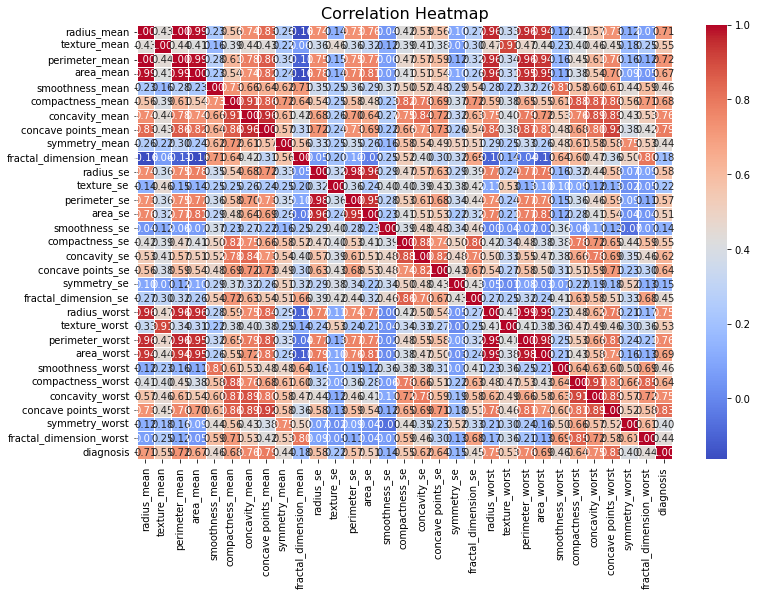

In [33]:
# Compute the correlation matrix
correlation_matrix = df.corr()

# Create a heatmap to visualize the correlation matrix
plt.figure(figsize=(12, 8))  # Adjust figure size
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)

# Customize the plot
plt.title('Correlation Heatmap', fontsize=16)
plt.show()

## Feature Correlation By Ranking

In [34]:
correlation_with_success = correlation_matrix['diagnosis']

# Sort the correlation values in descending order
correlation_ranked = correlation_with_success.sort_values(ascending=False)

# Print the ranked correlation values
print(correlation_ranked)

diagnosis                  1.000000
concave points_worst       0.826953
concave points_mean        0.787673
perimeter_worst            0.759138
concavity_mean             0.758164
concavity_worst            0.748156
radius_worst               0.747069
perimeter_mean             0.722950
radius_mean                0.706586
area_worst                 0.685533
compactness_mean           0.680383
area_mean                  0.666615
compactness_worst          0.642024
concave points_se          0.637441
concavity_se               0.618779
radius_se                  0.575084
perimeter_se               0.566173
compactness_se             0.545845
texture_mean               0.545312
texture_worst              0.531582
area_se                    0.512911
smoothness_mean            0.463258
smoothness_worst           0.461652
fractal_dimension_se       0.450282
symmetry_mean              0.441105
fractal_dimension_worst    0.437184
symmetry_worst             0.400540
texture_se                 0

## Feature Correlation by Class Visualized

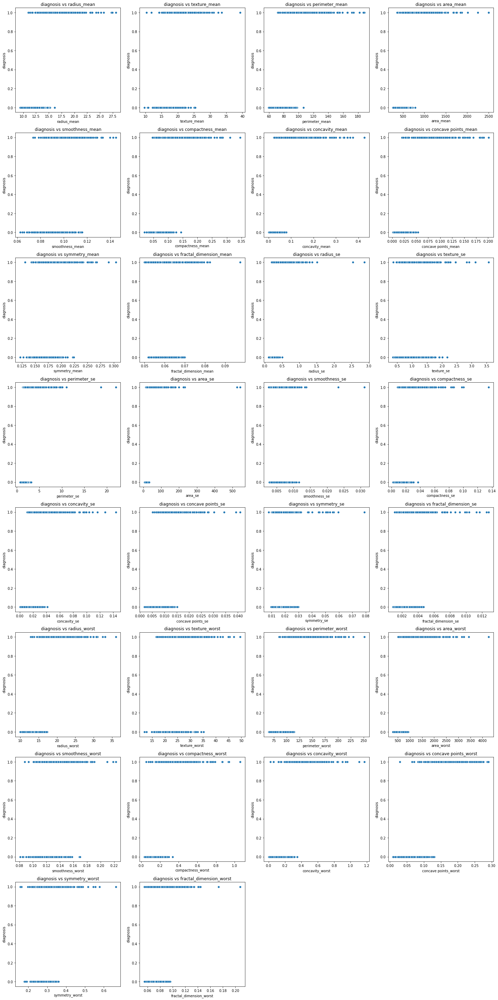

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

# Function to plot scatter plots for features vs target
def plot_scatter_features_vs_target(df, features, target, cols_per_row=4):
    num_features = len(features)
    rows = (num_features // cols_per_row) + (1 if num_features % cols_per_row != 0 else 0)
    
    plt.figure(figsize=(cols_per_row * 5, rows * 5))
    
    # Iterate through each feature and plot it against the target
    for i, feature in enumerate(features):
        plt.subplot(rows, cols_per_row, i + 1)
        sns.scatterplot(x=df[feature], y=df[target])
        plt.title(f'{target} vs {feature}')
        plt.xlabel(feature)
        plt.ylabel(target)
    
    plt.tight_layout()
    plt.show()

# Get the feature columns dynamically (all columns except the last one)
features = df.columns[:-1]

# Get the target column dynamically (the last column)
target = df.columns[-1]

# Call the function to plot scatter plots
plot_scatter_features_vs_target(df, features, target, cols_per_row=4)

# Feature Relationship 

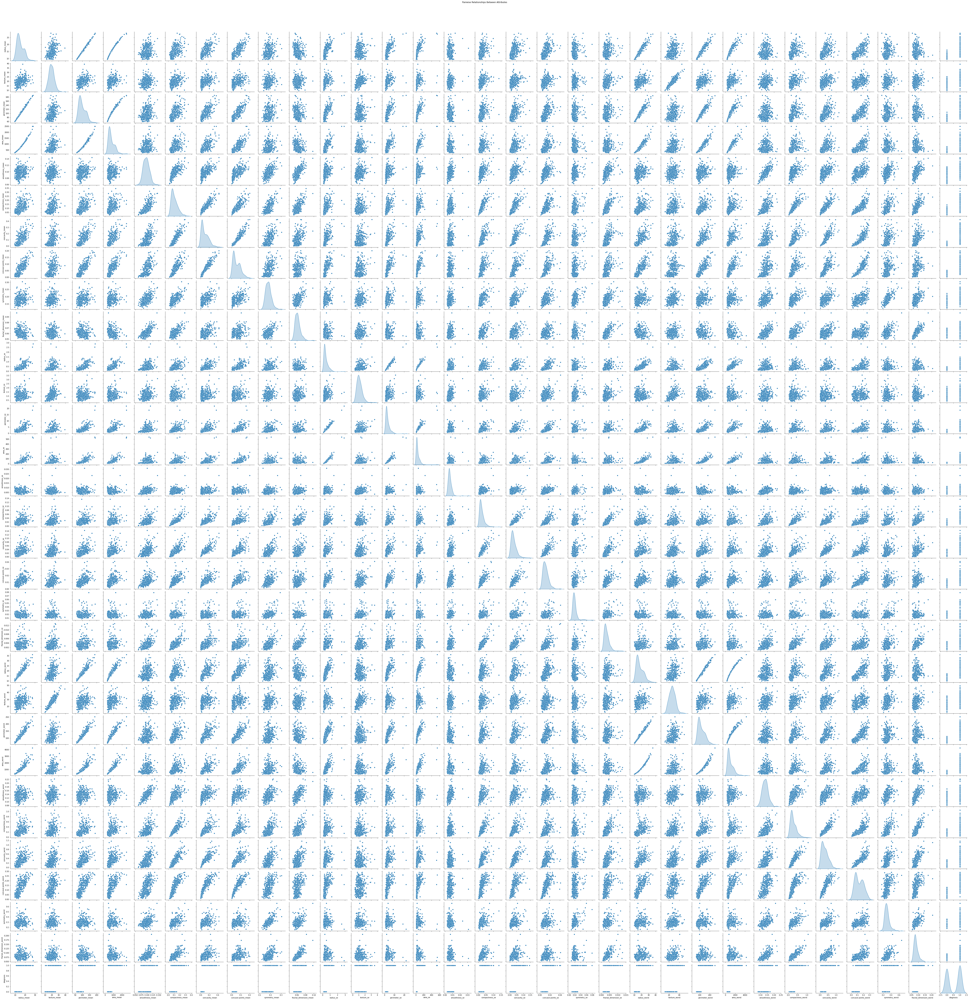

In [36]:
# Pairplot to visualize relationships
sns.pairplot(df, diag_kind="kde")
plt.suptitle("Pairwise Relationships Between Attributes", y=1.02)
plt.show()

# Feature Importance

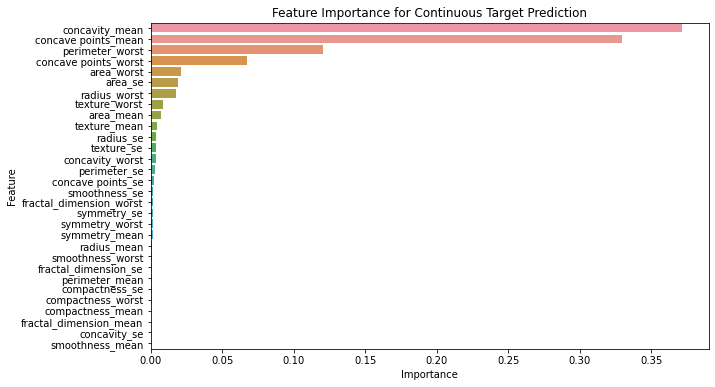

In [37]:
from sklearn.ensemble import RandomForestRegressor

# Prepare data
X = df.drop(columns=[df.columns[-1]])  # Drop the last column (target)
y = df[df.columns[-1]]  # Select the last column (target

# Train a Random Forest Regressor model
rf = RandomForestRegressor()
rf.fit(X, y)

# Get feature importances
importances = rf.feature_importances_

# Create a DataFrame for feature importances
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Plot the feature importance
plt.figure(figsize=(10, 6))
sns.barplot(data=feature_importance_df, x='Importance', y='Feature')
plt.title('Feature Importance for Continuous Target Prediction')
plt.show()

In [38]:
# Get the top 5 features
df_top5_importance = feature_importance_df.head(5)

# Create a new DataFrame with only the top 5 features and the target
df_top5_importance = X[df_top5_importance['Feature']].copy()
df_top5_importance['diagnosis'] = y  # Add the target column

df_top5_importance

,concavity_mean,concave points_mean,perimeter_worst,concave points_worst,area_worst,diagnosis
0,0.30010,0.147100,184.60,0.26540,2019.0,1
1,0.08690,0.070170,158.80,0.18600,1956.0,1
2,0.19740,0.127900,152.50,0.24300,1709.0,1
3,0.24140,0.105200,98.87,0.25750,567.7,1
4,0.19800,0.104300,152.20,0.16250,1575.0,1
...,...,...,...,...,...,...
393,0.03688,0.023690,99.17,0.06845,688.6,0
394,0.02974,0.024430,97.58,0.07174,729.8,0
395,0.01012,0.005495,71.12,0.02381,384.9,0
396,0.02337,0.009615,69.10,0.03846,364.2,0


# Feature Selection RFE

In [39]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression 

# Create the model
model = LogisticRegression() 

# Create the RFE model and select the top 5 features 
rfe = RFE(estimator=model, n_features_to_select=5)
rfe.fit(X, y)

# Print the features selected by RFE
selected_features = X.columns[rfe.support_]
print(f"Selected Features: {selected_features}")

# Print the ranking of all features
print(f"Feature Ranking: {rfe.ranking_}")

C:\Users\amiru\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\amiru\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

Selected Features: Index(['radius_mean', 'concavity_mean', 'perimeter_se', 'concavity_worst',
       'concave points_worst'],
      dtype='object')
Feature Ranking: [ 1 17 14 18 20  7  1  6 19 23 13  8  1 10 26 12  9 22 21 24  5  3  2 25
 15  4  1  1 16 11]


C:\Users\amiru\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\amiru\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

In [40]:
# Retain only the selected features in the DataFrame
df_rfe = df[selected_features]

# Optionally, you can add the target column ('Air Quality') back to df_selected
df_rfe['diagnosis'] = y

df_rfe

C:\Users\amiru\AppData\Local\Temp\ipykernel_11128\3567963964.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rfe['diagnosis'] = y


,radius_mean,concavity_mean,perimeter_se,concavity_worst,concave points_worst,diagnosis
0,17.990,0.30010,8.589,0.71190,0.26540,1
1,20.570,0.08690,3.398,0.24160,0.18600,1
2,19.690,0.19740,4.585,0.45040,0.24300,1
3,11.420,0.24140,3.445,0.68690,0.25750,1
4,20.290,0.19800,5.438,0.40000,0.16250,1
...,...,...,...,...,...,...
393,13.870,0.03688,2.076,0.13770,0.06845,0
394,13.620,0.02974,2.066,0.10490,0.07174,0
395,10.320,0.01012,1.356,0.04384,0.02381,0
396,9.683,0.02337,2.054,0.09350,0.03846,0


# Feature Scaling

## Reverify Feature Distribution

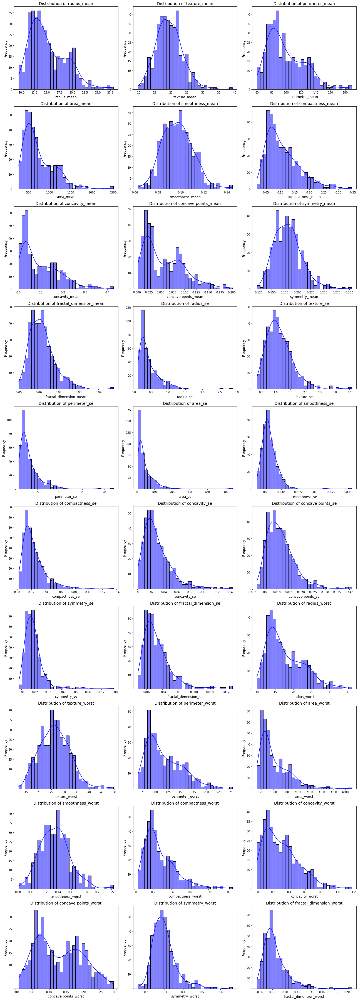

In [41]:
import seaborn as sns

df_features = df.iloc[:, :-1]

# Visualize the distribution of all features except the target
def plot_distributions(df, cols_per_row=3):
    num_cols = len(df.columns)
    num_rows = (num_cols // cols_per_row) + int(num_cols % cols_per_row > 0)

    plt.figure(figsize=(cols_per_row * 6, num_rows * 5))
    for i, column in enumerate(df.columns, 1):
        plt.subplot(num_rows, cols_per_row, i)
        sns.histplot(df[column], kde=True, bins=30, color='blue', edgecolor='black')
        plt.title(f"Distribution of {column}", fontsize=14)  # Increased title font size
        plt.xlabel(column, fontsize=12)  # Increased x-label font size
        plt.ylabel("Frequency", fontsize=12)  # Increased y-label font size
        plt.tight_layout()
    plt.show()

# Call the function to plot distributions
plot_distributions(df_features, cols_per_row=3)

## Log Scaling for Positively Skewed Data

In [42]:
skewness_values = df.skew()

# Display features with positive skewness values above 1
strongly_pos_skewed = skewness_values[skewness_values > 1]
print(strongly_pos_skewed)

area_mean                  1.417998
compactness_mean           1.125871
concavity_mean             1.088626
fractal_dimension_mean     1.151483
radius_se                  2.754464
texture_se                 1.312613
perimeter_se               3.043964
area_se                    4.739355
smoothness_se              3.647604
compactness_se             2.192134
concavity_se               1.702841
concave points_se          1.366366
symmetry_se                3.005701
fractal_dimension_se       2.086396
area_worst                 1.542909
compactness_worst          1.404278
symmetry_worst             1.514465
fractal_dimension_worst    1.854358
dtype: float64


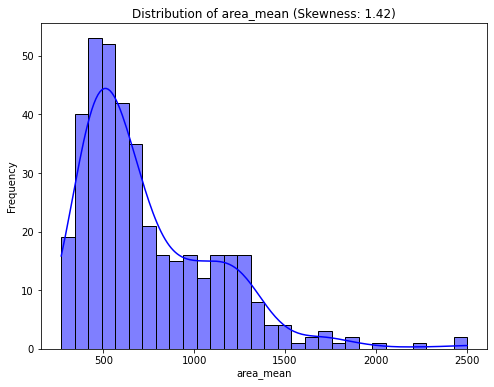

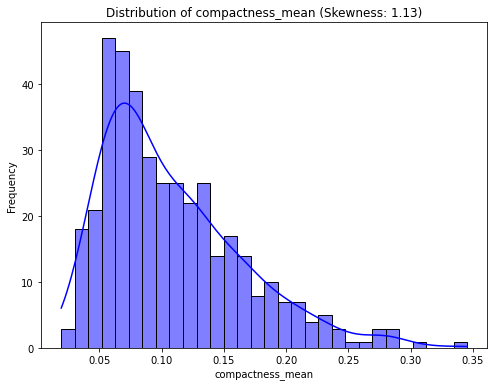

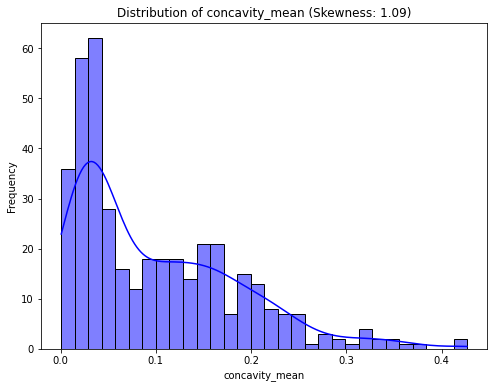

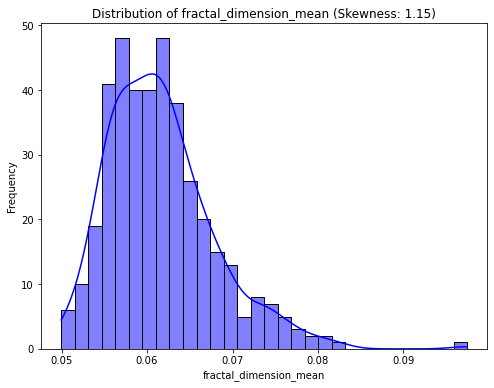

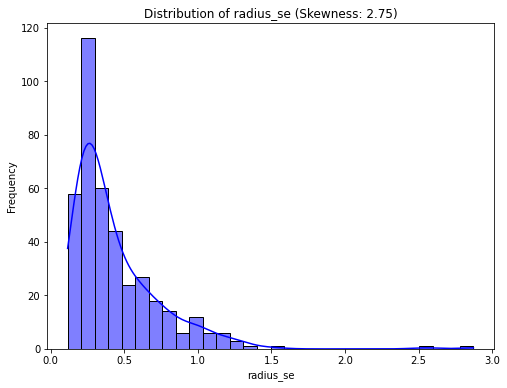

...

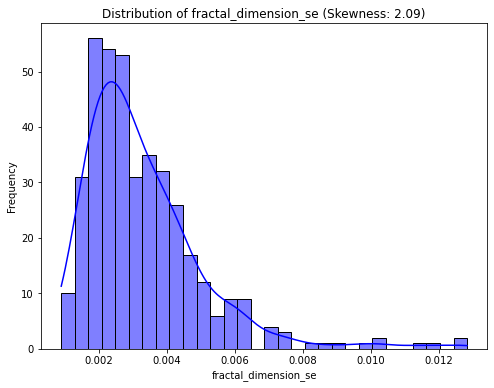

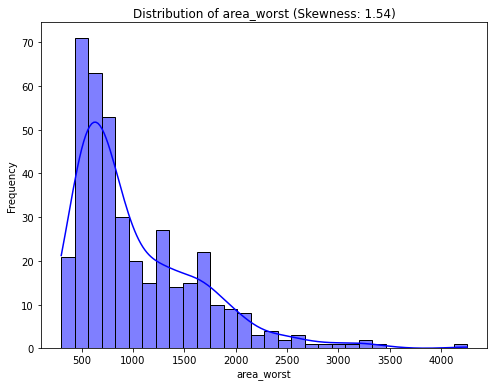

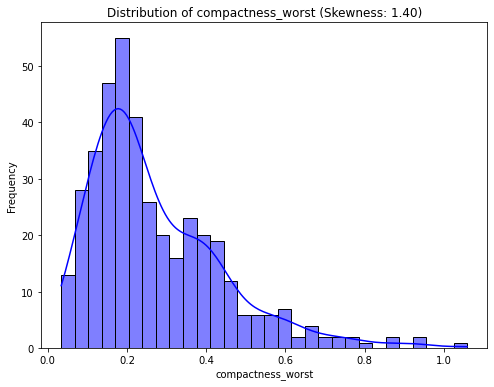

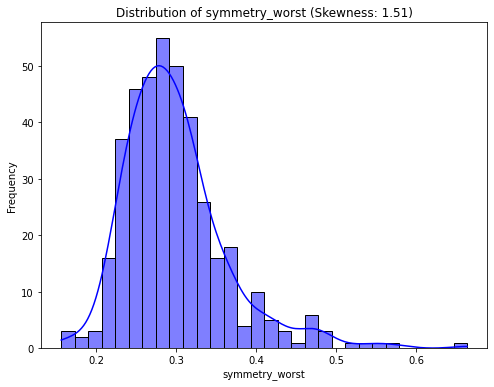

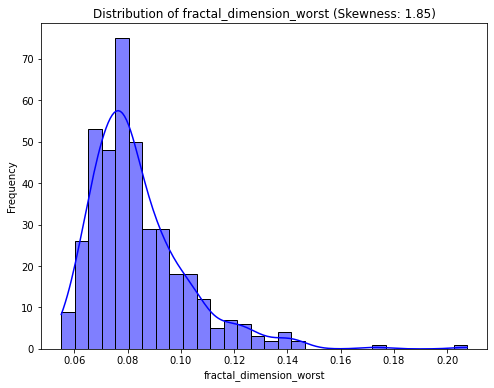

In [43]:
# Plotting the distributions for these strongly positively skewed features
for feature in strongly_pos_skewed.index:
    plt.figure(figsize=(8, 6))
    sns.histplot(df[feature], kde=True, bins=30, color='blue')
    plt.title(f'Distribution of {feature} (Skewness: {skewness_values[feature]:.2f})')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()

## Log Scaling for Baseline Data

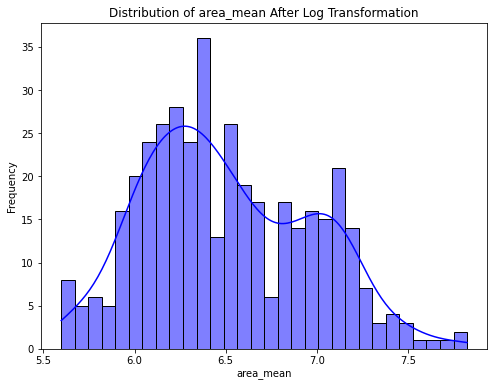

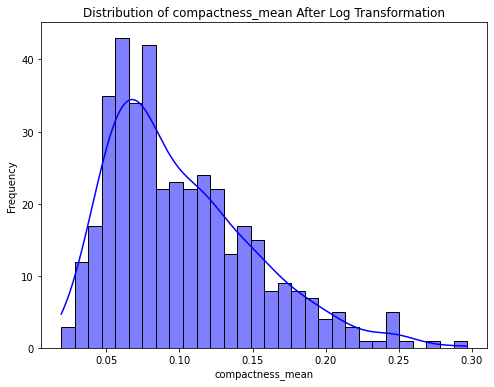

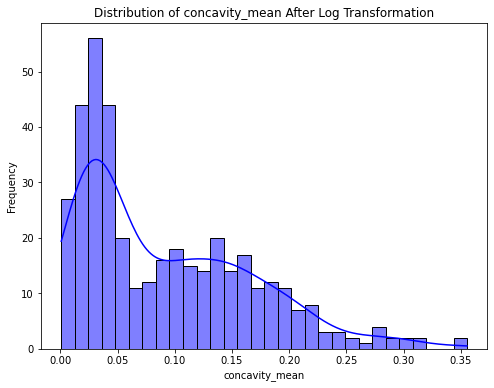

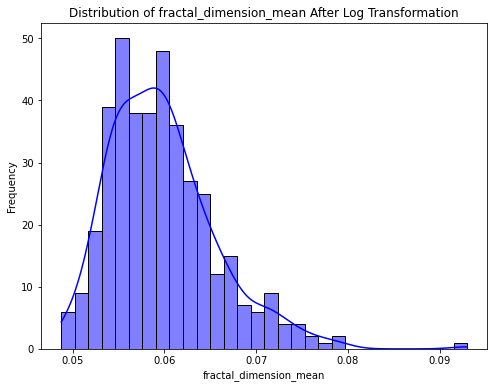

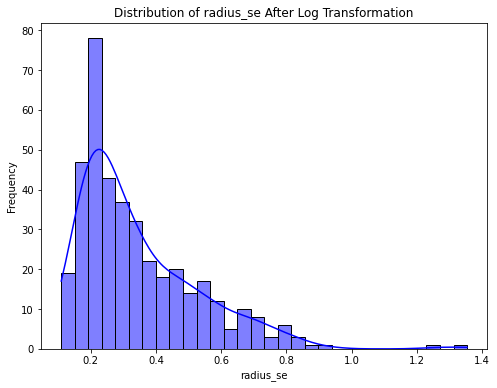

...

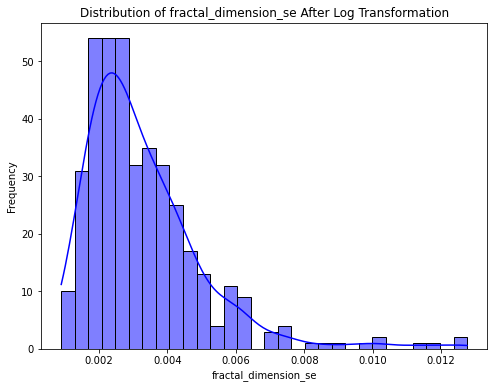

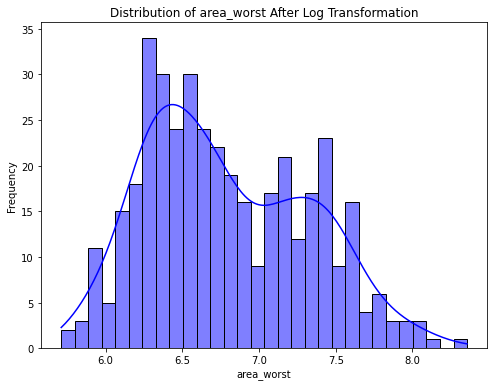

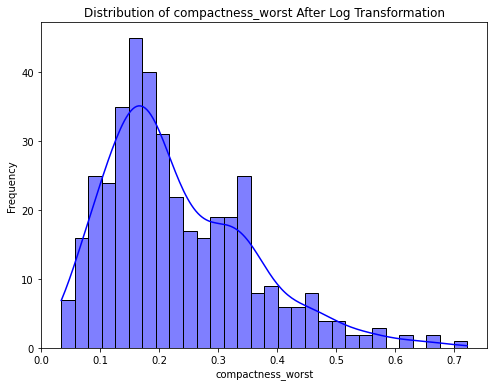

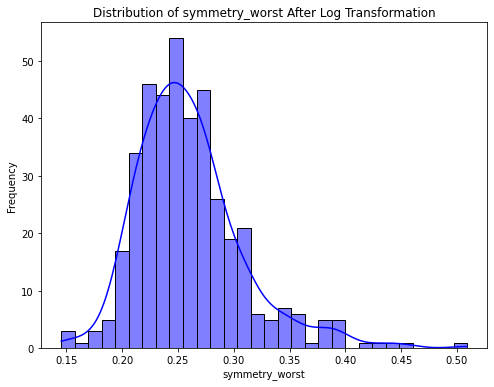

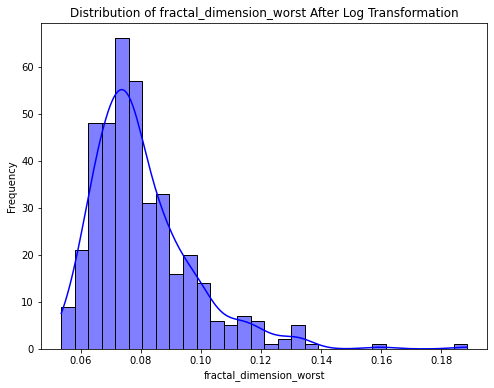

In [44]:
# Log scale transformation for the strongly skewed features
for feature in strongly_pos_skewed.index:
    # Apply log transformation, adding 1 to avoid log(0) if needed
    df[feature] = np.log(df[feature] + 1)
    
    # Plotting the distributions after log transformation
    plt.figure(figsize=(8, 6))
    sns.histplot(df[feature], kde=True, bins=30, color='blue')
    plt.title(f'Distribution of {feature} After Log Transformation')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()

## Log Scaling for Top 5 Feature Importance Data

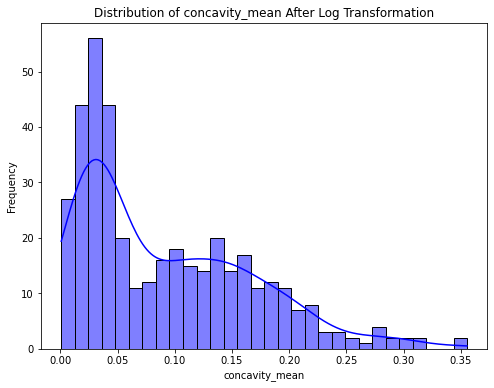

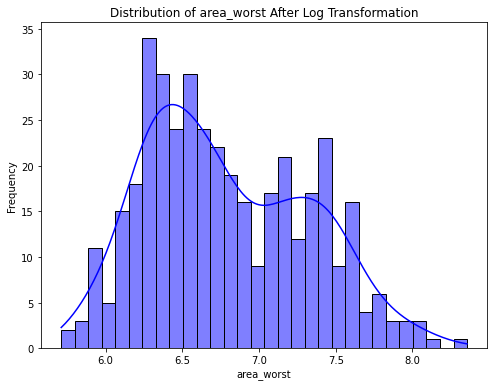

In [45]:
# Log scale transformation for the strongly skewed features
for feature in strongly_pos_skewed.index:
    if feature in df_top5_importance.columns:
        # Apply log transformation, adding 1 to avoid log(0) if needed
        df_top5_importance[feature] = np.log(df_top5_importance[feature] + 1)
        
        # Plotting the distributions after log transformation
        plt.figure(figsize=(8, 6))
        sns.histplot(df_top5_importance[feature], kde=True, bins=30, color='blue')
        plt.title(f'Distribution of {feature} After Log Transformation')
        plt.xlabel(feature)
        plt.ylabel('Frequency')
        plt.show()

## Log Scaling for RFE Data

C:\Users\amiru\AppData\Local\Temp\ipykernel_11128\844926998.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rfe[feature] = np.log(df_rfe[feature] + 1)


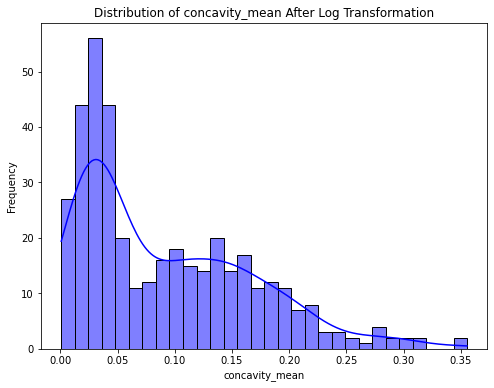

C:\Users\amiru\AppData\Local\Temp\ipykernel_11128\844926998.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rfe[feature] = np.log(df_rfe[feature] + 1)


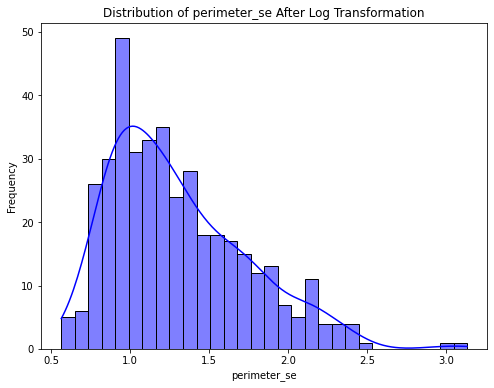

In [46]:
# Log scale transformation for the strongly skewed features
for feature in strongly_pos_skewed.index:
    if feature in df_rfe.columns:
        # Apply log transformation, adding 1 to avoid log(0) if needed
        df_rfe[feature] = np.log(df_rfe[feature] + 1)
        
        # Plotting the distributions after log transformation
        plt.figure(figsize=(8, 6))
        sns.histplot(df_rfe[feature], kde=True, bins=30, color='blue')
        plt.title(f'Distribution of {feature} After Log Transformation')
        plt.xlabel(feature)
        plt.ylabel('Frequency')
        plt.show()

## Final Log Scaled Data

In [47]:
df

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,17.990,10.38,122.80,6.909753,0.11840,0.244983,0.262441,0.147100,0.2419,0.075766,...,17.33,184.60,7.610853,0.1622,0.510185,0.71190,0.26540,0.378505,0.112346,1
1,20.570,17.77,132.90,7.190676,0.08474,0.075701,0.083330,0.070170,0.1812,0.055122,...,23.41,158.80,7.579168,0.1238,0.171092,0.24160,0.18600,0.242946,0.085278,1
2,19.690,21.25,130.00,7.093405,0.10960,0.148334,0.180153,0.127900,0.2069,0.058259,...,25.53,152.50,7.444249,0.1444,0.353821,0.45040,0.24300,0.308440,0.083955,1
3,11.420,20.38,77.58,5.958683,0.14250,0.249902,0.216240,0.105200,0.2597,0.092980,...,26.50,98.87,6.343353,0.2098,0.623958,0.68690,0.25750,0.509104,0.159565,1
4,20.290,14.34,135.10,7.168580,0.10030,0.124692,0.180653,0.104300,0.1809,0.057165,...,16.67,152.20,7.362645,0.1374,0.186480,0.40000,0.16250,0.212204,0.073975,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
393,13.870,20.70,89.77,6.372978,0.09578,0.096945,0.036216,0.023690,0.1620,0.064739,...,24.75,99.17,6.536112,0.1264,0.185400,0.13770,0.06845,0.202859,0.081506,0
394,13.620,23.23,87.19,6.352978,0.09246,0.065291,0.029306,0.024430,0.1664,0.056390,...,29.09,97.58,6.594140,0.1216,0.141239,0.10490,0.07174,0.234440,0.067219,0
395,10.320,16.35,65.31,5.786591,0.09434,0.048733,0.010069,0.005495,0.1885,0.060163,...,21.77,71.12,5.955578,0.1285,0.084727,0.04384,0.02381,0.237520,0.071381,0
396,9.683,19.34,61.05,5.658436,0.08491,0.049076,0.023101,0.009615,0.1580,0.060483,...,25.59,69.10,5.900445,0.1199,0.091174,0.09350,0.03846,0.227295,0.076220,0


In [48]:
df_top5_importance

,concavity_mean,concave points_mean,perimeter_worst,concave points_worst,area_worst,diagnosis
0,0.262441,0.147100,184.60,0.26540,7.610853,1
1,0.083330,0.070170,158.80,0.18600,7.579168,1
2,0.180153,0.127900,152.50,0.24300,7.444249,1
3,0.216240,0.105200,98.87,0.25750,6.343353,1
4,0.180653,0.104300,152.20,0.16250,7.362645,1
...,...,...,...,...,...,...
393,0.036216,0.023690,99.17,0.06845,6.536112,0
394,0.029306,0.024430,97.58,0.07174,6.594140,0
395,0.010069,0.005495,71.12,0.02381,5.955578,0
396,0.023101,0.009615,69.10,0.03846,5.900445,0


In [49]:
df_rfe

,radius_mean,concavity_mean,perimeter_se,concavity_worst,concave points_worst,diagnosis
0,17.990,0.262441,2.260617,0.71190,0.26540,1
1,20.570,0.083330,1.481150,0.24160,0.18600,1
2,19.690,0.180153,1.720084,0.45040,0.24300,1
3,11.420,0.216240,1.491780,0.68690,0.25750,1
4,20.290,0.180653,1.862218,0.40000,0.16250,1
...,...,...,...,...,...,...
393,13.870,0.036216,1.123630,0.13770,0.06845,0
394,13.620,0.029306,1.120374,0.10490,0.07174,0
395,10.320,0.010069,0.856965,0.04384,0.02381,0
396,9.683,0.023101,1.116452,0.09350,0.03846,0


## Min-Max Scaling

## Baseline Data

In [50]:
from sklearn.preprocessing import MinMaxScaler

# Convert DataFrame to numpy array
array = df.values

# Separate array into input (X) and output (Y) components
X = array[:, :-1]  # Input features (all rows, all columns except the last one)
Y = array[:, -1]   # Output target (all rows, only the last column)

# Initialize MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))

# Rescale the input features
rescaledX = scaler.fit_transform(X)

# Print first 5 rescaled inputs
print(rescaledX[0:5, :])

[[0.45919949 0.0226581  0.48970874 0.58912226 0.68000973 0.81366252
  0.73785771 0.72861529 0.65972603 0.6107836  0.50640782 0.27818686
  0.66005365 0.70353475 0.1327231  0.3657818  0.38637462 0.36340898
  0.31901537 0.4450069  0.59117929 0.14152452 0.64207019 0.71838256
  0.5726919  0.69251139 0.60784314 0.90913641 0.64092086 0.43539963]
 [0.59707155 0.27257355 0.56815534 0.71525696 0.27047086 0.203629
  0.2329517  0.34270723 0.32712329 0.14403471 0.26100697 0.2003737
  0.35687912 0.5336135  0.09102465 0.08614808 0.13270092 0.29974097
  0.0872257  0.22179762 0.57622244 0.30357143 0.50341269 0.70640534
  0.30102582 0.19963631 0.20524245 0.62731729 0.26820562 0.23485755]
 [0.55004542 0.3902604  0.54563107 0.67158197 0.57294075 0.46537189
  0.50589039 0.6323013  0.46794521 0.21496289 0.35984638 0.22522757
  0.449813   0.58914803 0.12388311 0.29685954 0.27615649 0.48438851
  0.21133096 0.30902108 0.52176414 0.36007463 0.46955447 0.6554043
  0.44676335 0.46523419 0.38398586 0.82963076 0.44

## Min-Max (Feature Importance Data)

In [51]:
from sklearn.preprocessing import MinMaxScaler

# Convert DataFrame to numpy array
array = df_top5_importance.values

# Separate array into input (X) and output (Y) components
X = array[:, :-1]  # Input features (all rows, all columns except the last one)
Y = array[:, -1]   # Output target (all rows, only the last column)

# Initialize MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))

# Rescale the input features
rescaledX_top5 = scaler.fit_transform(X)

# Print first 5 rescaled inputs
print(rescaledX_top5[0:5, :])

[[0.73785771 0.72861529 0.64207019 0.90913641 0.71838256]
 [0.2329517  0.34270723 0.50341269 0.62731729 0.70640534]
 [0.50589039 0.6323013  0.46955447 0.82963076 0.6554043 ]
 [0.60761839 0.51843008 0.18132961 0.88109647 0.23925324]
 [0.50730257 0.51391536 0.46794217 0.54390735 0.6245573 ]]


## Min-Max (RFE)

In [52]:
from sklearn.preprocessing import MinMaxScaler

# Convert DataFrame to numpy array
array = df_rfe.values

# Separate array into input (X) and output (Y) components
X = array[:, :-1]  # Input features (all rows, all columns except the last one)
Y = array[:, -1]   # Output target (all rows, only the last column)

# Initialize MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))

# Rescale the input features
rescaledX_rfe = scaler.fit_transform(X)

# Print first 5 rescaled inputs
print(rescaledX_rfe[0:5, :])

[[0.45919949 0.73785771 0.66005365 0.60784314 0.90913641]
 [0.59707155 0.2329517  0.35687912 0.20524245 0.62731729]
 [0.55004542 0.50589039 0.449813   0.38398586 0.82963076]
 [0.10810666 0.60761839 0.36101366 0.58644187 0.88109647]
 [0.58210869 0.50730257 0.505096   0.3408409  0.54390735]]


In [53]:
# Verify total rows and columns are matched

# Print the dimensions of rescaledX
print("Total Rows in rescaledX:", rescaledX.shape[0])
print("Total Columns in rescaledX:", rescaledX.shape[1])

# Compare with the first 30 columns of df
df_subset = df.iloc[:, :30]  # Select the first 30 columns
print("Total Rows in df (first 30 columns):", df_subset.shape[0])
print("Total Columns in df (first 30 columns):", df_subset.shape[1])

# Check if the totals match
if rescaledX.shape == df_subset.shape:
    print("\nThe total rows and columns match!")
else:
    print("\nThe totals do not match.")

# Show rescaledX for further inspection (optional)
print("\nRescaled Input Features (first 5 rows):")
rescaledX

Total Rows in rescaledX: 398
Total Columns in rescaledX: 30
Total Rows in df (first 30 columns): 398
Total Columns in df (first 30 columns): 30

The total rows and columns match!

Rescaled Input Features (first 5 rows):


array([[0.45919949, 0.0226581 , 0.48970874, ..., 0.90913641, 0.64092086,
        0.43539963],
       [0.59707155, 0.27257355, 0.56815534, ..., 0.62731729, 0.26820562,
        0.23485755],
       [0.55004542, 0.3902604 , 0.54563107, ..., 0.82963076, 0.44827952,
        0.2250544 ],
       ...,
       [0.049324  , 0.22455191, 0.04318447, ..., 0.05164673, 0.2532857 ,
        0.13189266],
       [0.01528349, 0.32566791, 0.01009709, ..., 0.10364484, 0.2251729 ,
        0.16774669],
       [0.09260942, 0.43050389, 0.09118447, ..., 0.19475689, 0.35710796,
        0.17543166]])

In [54]:
Y

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

# Data Preparation 

## Splitting to Train and Test Data

### Baseline Data

In [55]:
import pandas as pd
from sklearn.model_selection import train_test_split

array = df.values

# Extract X (features) and y (target)
X = rescaledX
y = Y

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

### Top 5 Feature Importance Data

In [56]:
import pandas as pd
from sklearn.model_selection import train_test_split

array = df_top5_importance.values

# Extract X (features) and y (target)
X_top5 = rescaledX_top5
y_top5 = Y

# Split data into training and testing sets
X_train_top5, X_test_top5, y_train_top5, y_test_top5 = train_test_split(X_top5, y_top5, test_size=0.3, random_state=42)

### RFE Data

In [57]:
import pandas as pd
from sklearn.model_selection import train_test_split

array = df_rfe.values

# Extract X (features) and y (target)
X_rfe = rescaledX_rfe
y_rfe = array[:, -1]  

# Split data into training and testing sets
X_train_rfe, X_test_rfe, y_train_rfe, y_test_rfe = train_test_split(X_rfe, y_rfe, test_size=0.3, random_state=42)

## Checking for Total Training and Test Data After Splitting

In [58]:
print("Total training data of X:", len(X_train))
print("Total test data of X:", len(X_test))
print()
print("Total training data of Y:", len(y_train))
print("Total test data of Y:", len(y_test))

Total training data of X: 278
Total test data of X: 120

Total training data of Y: 278
Total test data of Y: 120


##  Checking for Data Imbalance in Training Data

In [59]:
# Convert y_train to pandas Series if it is a NumPy array
y_train_series = pd.Series(y_train)

# Calculate the class distribution in the training data
class_dist_train = y_train_series.value_counts()
print("Class distribution in training data:")
print(class_dist_train)
print()

# Calculate the percentage for each class in the training data
total_samples_train = class_dist_train.sum()
percentages_train = (class_dist_train / total_samples_train) * 100
print("Class Percentages in Training Data:")
print(percentages_train)

Class distribution in training data:
1.0    145
0.0    133
dtype: int64

Class Percentages in Training Data:
1.0    52.158273
0.0    47.841727
dtype: float64


## SMOTE Oversampling for Minority Class

In [60]:
from imblearn.over_sampling import SMOTE

# Convert y_train_top5 and y_train_rfe to pandas Series for easier manipulation
y_train = pd.Series(y_train)
y_train_top5 = pd.Series(y_train_top5)
y_train_rfe = pd.Series(y_train_rfe)

# Display class distribution before oversampling
print('Before Oversampling for X_train:')
print(y_train.value_counts())
print()
print('Before Oversampling for X_train_top5:')
print(y_train_top5.value_counts())
print()
print('Before Oversampling for X_train_rfe:')
print(y_train_rfe.value_counts())

# Apply SMOTE for oversampling on the full training set
smote = SMOTE(random_state=42)

# Oversample X_train, y_train
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Oversample X_train_top5, y_train_top5
X_train_top5_smote, y_train_top5_smote = smote.fit_resample(X_train_top5, y_train_top5)

# Oversample X_train_rfe, y_train_rfe
X_train_rfe_smote, y_train_rfe_smote = smote.fit_resample(X_train_rfe, y_train_rfe)

# Convert y_train_smote, y_train_top5_smote, and y_train_rfe_smote back to pandas Series
y_train_smote = pd.Series(y_train_smote)
y_train_top5_smote = pd.Series(y_train_top5_smote)
y_train_rfe_smote = pd.Series(y_train_rfe_smote)

# Display class distribution after oversampling
print('After Oversampling for X_train:')
print(y_train_smote.value_counts())
print()
print('After Oversampling for X_train_top5:')
print(y_train_top5_smote.value_counts())
print()
print('After Oversampling for X_train_rfe:')
print(y_train_rfe_smote.value_counts())

Before Oversampling for X_train:
1.0    145
0.0    133
dtype: int64

Before Oversampling for X_train_top5:
1.0    145
0.0    133
dtype: int64

Before Oversampling for X_train_rfe:
1.0    145
0.0    133
dtype: int64
After Oversampling for X_train:
1.0    145
0.0    145
dtype: int64

After Oversampling for X_train_top5:
1.0    145
0.0    145
dtype: int64

After Oversampling for X_train_rfe:
1.0    145
0.0    145
dtype: int64


# Supervised Learning

## Train, Test and Evaluate Models

### Baseline Data

Logistic Regression: Accuracy: 0.983
Classification Report for Logistic Regression:
               precision    recall  f1-score   support

         0.0       0.96      1.00      0.98        53
         1.0       1.00      0.97      0.98        67

    accuracy                           0.98       120
   macro avg       0.98      0.99      0.98       120
weighted avg       0.98      0.98      0.98       120




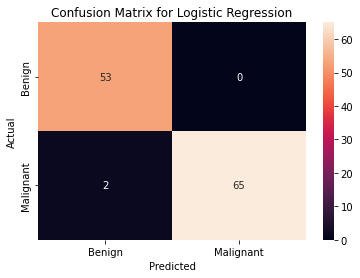

KNN: Accuracy: 0.992
Classification Report for KNN:
               precision    recall  f1-score   support

         0.0       0.98      1.00      0.99        53
         1.0       1.00      0.99      0.99        67

    accuracy                           0.99       120
   macro avg       0.99      0.99      0.99       120
weighted avg       0.99      0.99      0.99       120




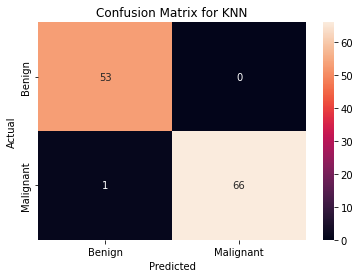

Decision Tree: Accuracy: 0.958
Classification Report for Decision Tree:
               precision    recall  f1-score   support

         0.0       0.93      0.98      0.95        53
         1.0       0.98      0.94      0.96        67

    accuracy                           0.96       120
   macro avg       0.96      0.96      0.96       120
weighted avg       0.96      0.96      0.96       120




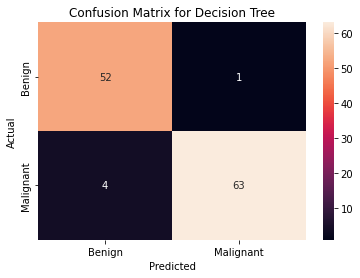

Naive Bayes: Accuracy: 0.983
Classification Report for Naive Bayes:
               precision    recall  f1-score   support

         0.0       0.96      1.00      0.98        53
         1.0       1.00      0.97      0.98        67

    accuracy                           0.98       120
   macro avg       0.98      0.99      0.98       120
weighted avg       0.98      0.98      0.98       120




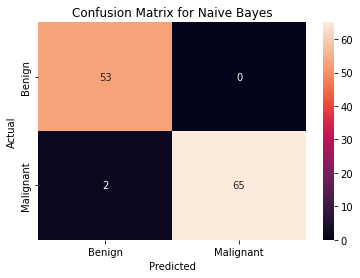

Support Vector Machine: Accuracy: 0.992
Classification Report for Support Vector Machine:
               precision    recall  f1-score   support

         0.0       0.98      1.00      0.99        53
         1.0       1.00      0.99      0.99        67

    accuracy                           0.99       120
   macro avg       0.99      0.99      0.99       120
weighted avg       0.99      0.99      0.99       120




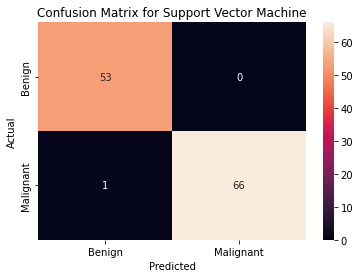

GBM: Accuracy: 0.967
Classification Report for GBM:
               precision    recall  f1-score   support

         0.0       0.95      0.98      0.96        53
         1.0       0.98      0.96      0.97        67

    accuracy                           0.97       120
   macro avg       0.97      0.97      0.97       120
weighted avg       0.97      0.97      0.97       120




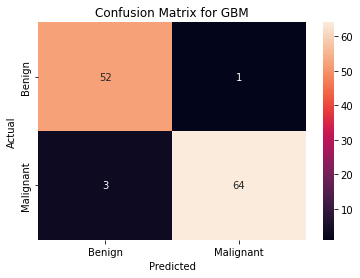

XGBoost: Accuracy: 0.983
Classification Report for XGBoost:
               precision    recall  f1-score   support

         0.0       0.98      0.98      0.98        53
         1.0       0.99      0.99      0.99        67

    accuracy                           0.98       120
   macro avg       0.98      0.98      0.98       120
weighted avg       0.98      0.98      0.98       120




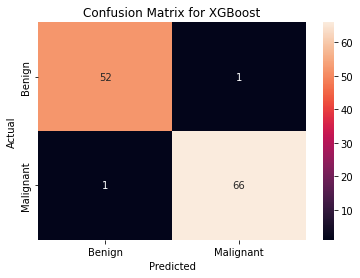

MLP: Accuracy: 0.983
Classification Report for MLP:
               precision    recall  f1-score   support

         0.0       0.98      0.98      0.98        53
         1.0       0.99      0.99      0.99        67

    accuracy                           0.98       120
   macro avg       0.98      0.98      0.98       120
weighted avg       0.98      0.98      0.98       120




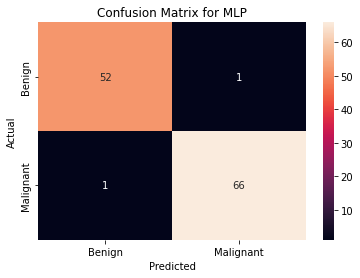

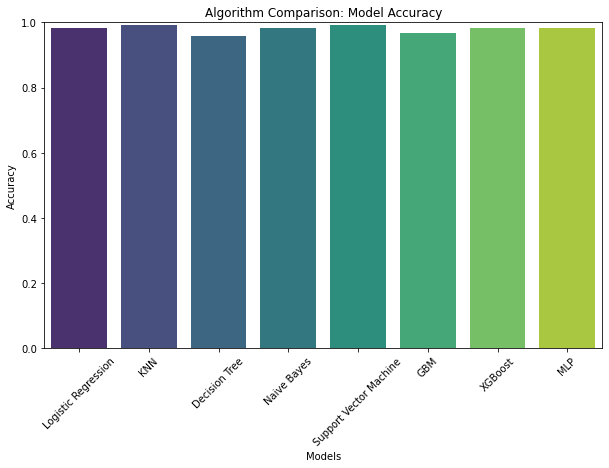

In [61]:
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_val_score

# Prepare models
models = [
    ('Logistic Regression', LogisticRegression(solver='liblinear')),
    ('KNN', KNeighborsClassifier()),
    ('Decision Tree', DecisionTreeClassifier()),
    ('Naive Bayes', GaussianNB()),
    ('Support Vector Machine', SVC()),
    ('GBM', GradientBoostingClassifier()),
    ('XGBoost', xgb.XGBClassifier(eval_metric='mlogloss')),
    ('MLP', MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=500))
]

# Prepare lists to store results and names
results = []
names = []

# Evaluate each model in turn
for name, model in models:
    # Train the model using training data (SMOTE for handling imbalance)
    model.fit(X_train_smote, y_train_smote)

    # Predict on the test set
    y_pred = model.predict(X_test)

    # Accuracy score
    accuracy = model.score(X_test, y_test)
    results.append(accuracy)
    names.append(name)
    print(f"{name}: Accuracy: {accuracy:.3f}")
    
    # Classification report
    print(f"Classification Report for {name}:\n", classification_report(y_test, y_pred))
    print()

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt="d", 
                xticklabels=['Benign', 'Malignant'], 
                yticklabels=['Benign', 'Malignant'])
    plt.title(f'Confusion Matrix for {name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

# Bar plot for algorithm comparison (accuracies of models)
plt.figure(figsize=(10, 6))
sns.barplot(x=names, y=results, palette='viridis')
plt.title('Algorithm Comparison: Model Accuracy')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.ylim(0, 1)  # Limiting y-axis from 0 to 1 for accuracy percentage
plt.xticks(rotation=45)  # Rotate model names for better readability
plt.show()

## Top 5 Feature Importance Data

Logistic Regression: Accuracy: 0.975
Classification Report for Logistic Regression:
               precision    recall  f1-score   support

         0.0       0.95      1.00      0.97        53
         1.0       1.00      0.96      0.98        67

    accuracy                           0.97       120
   macro avg       0.97      0.98      0.97       120
weighted avg       0.98      0.97      0.98       120




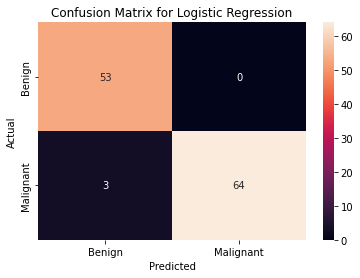

KNN: Accuracy: 0.975
Classification Report for KNN:
               precision    recall  f1-score   support

         0.0       0.95      1.00      0.97        53
         1.0       1.00      0.96      0.98        67

    accuracy                           0.97       120
   macro avg       0.97      0.98      0.97       120
weighted avg       0.98      0.97      0.98       120




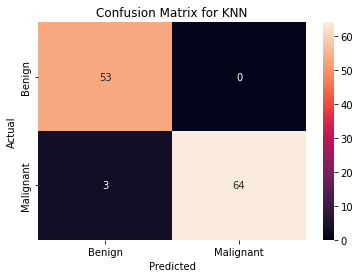

Decision Tree: Accuracy: 0.942
Classification Report for Decision Tree:
               precision    recall  f1-score   support

         0.0       0.93      0.94      0.93        53
         1.0       0.95      0.94      0.95        67

    accuracy                           0.94       120
   macro avg       0.94      0.94      0.94       120
weighted avg       0.94      0.94      0.94       120




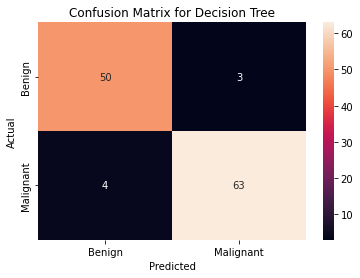

Naive Bayes: Accuracy: 0.975
Classification Report for Naive Bayes:
               precision    recall  f1-score   support

         0.0       0.95      1.00      0.97        53
         1.0       1.00      0.96      0.98        67

    accuracy                           0.97       120
   macro avg       0.97      0.98      0.97       120
weighted avg       0.98      0.97      0.98       120




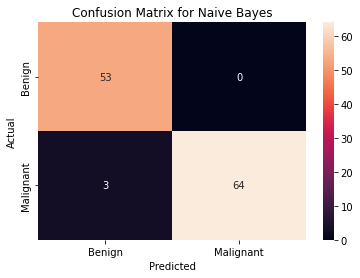

Support Vector Machine: Accuracy: 0.975
Classification Report for Support Vector Machine:
               precision    recall  f1-score   support

         0.0       0.96      0.98      0.97        53
         1.0       0.98      0.97      0.98        67

    accuracy                           0.97       120
   macro avg       0.97      0.98      0.97       120
weighted avg       0.98      0.97      0.98       120




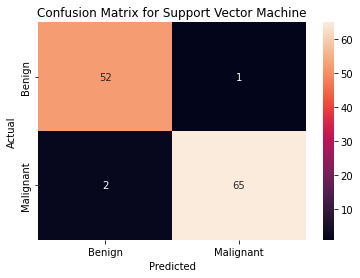

GBM: Accuracy: 0.958
Classification Report for GBM:
               precision    recall  f1-score   support

         0.0       0.93      0.98      0.95        53
         1.0       0.98      0.94      0.96        67

    accuracy                           0.96       120
   macro avg       0.96      0.96      0.96       120
weighted avg       0.96      0.96      0.96       120




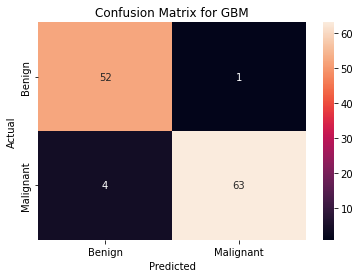

XGBoost: Accuracy: 0.975
Classification Report for XGBoost:
               precision    recall  f1-score   support

         0.0       0.95      1.00      0.97        53
         1.0       1.00      0.96      0.98        67

    accuracy                           0.97       120
   macro avg       0.97      0.98      0.97       120
weighted avg       0.98      0.97      0.98       120




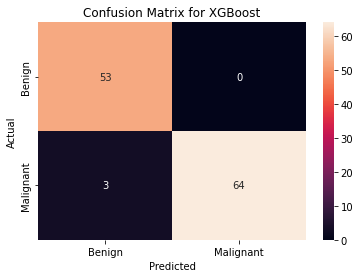

MLP: Accuracy: 0.975
Classification Report for MLP:
               precision    recall  f1-score   support

         0.0       0.96      0.98      0.97        53
         1.0       0.98      0.97      0.98        67

    accuracy                           0.97       120
   macro avg       0.97      0.98      0.97       120
weighted avg       0.98      0.97      0.98       120




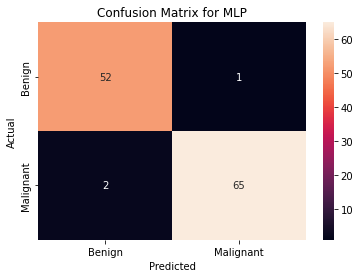

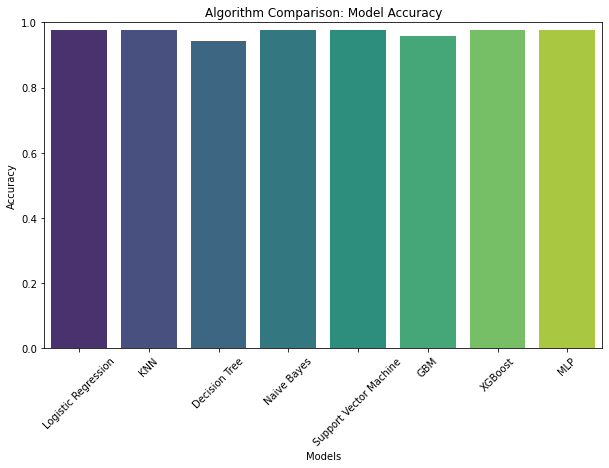

In [62]:
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_val_score

# Prepare models
models = [
    ('Logistic Regression', LogisticRegression(solver='liblinear')),
    ('KNN', KNeighborsClassifier()),
    ('Decision Tree', DecisionTreeClassifier()),
    ('Naive Bayes', GaussianNB()),
    ('Support Vector Machine', SVC()),
    ('GBM', GradientBoostingClassifier()),
    ('XGBoost', xgb.XGBClassifier(eval_metric='mlogloss')),
    ('MLP', MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=500))
]

# Prepare lists to store results and names
results = []
names = []

# Evaluate each model in turn
for name, model in models:
    # Train the model using training data (SMOTE for handling imbalance)
    model.fit(X_train_top5_smote, y_train_top5_smote)

    # Predict on the test set
    y_pred = model.predict(X_test_top5)

    # Accuracy score
    accuracy = model.score(X_test_top5, y_test_top5)
    results.append(accuracy)
    names.append(name)
    print(f"{name}: Accuracy: {accuracy:.3f}")
    
    # Classification report
    print(f"Classification Report for {name}:\n", classification_report(y_test, y_pred))
    print()

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt="d", 
                xticklabels=['Benign', 'Malignant'], 
                yticklabels=['Benign', 'Malignant'])
    plt.title(f'Confusion Matrix for {name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

# Bar plot for algorithm comparison (accuracies of models)
plt.figure(figsize=(10, 6))
sns.barplot(x=names, y=results, palette='viridis')
plt.title('Algorithm Comparison: Model Accuracy')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.ylim(0, 1)  # Limiting y-axis from 0 to 1 for accuracy percentage
plt.xticks(rotation=45)  # Rotate model names for better readability
plt.show()

### RFE Data

Logistic Regression: Accuracy: 0.975
Classification Report for Logistic Regression:
               precision    recall  f1-score   support

         0.0       0.95      1.00      0.97        53
         1.0       1.00      0.96      0.98        67

    accuracy                           0.97       120
   macro avg       0.97      0.98      0.97       120
weighted avg       0.98      0.97      0.98       120




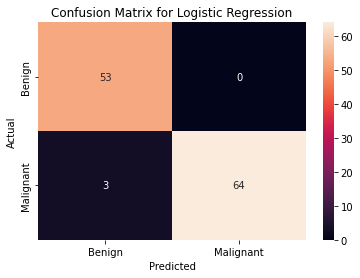

KNN: Accuracy: 0.975
Classification Report for KNN:
               precision    recall  f1-score   support

         0.0       0.96      0.98      0.97        53
         1.0       0.98      0.97      0.98        67

    accuracy                           0.97       120
   macro avg       0.97      0.98      0.97       120
weighted avg       0.98      0.97      0.98       120




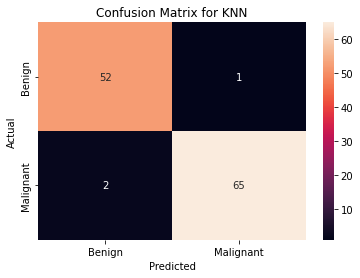

Decision Tree: Accuracy: 0.925
Classification Report for Decision Tree:
               precision    recall  f1-score   support

         0.0       0.89      0.94      0.92        53
         1.0       0.95      0.91      0.93        67

    accuracy                           0.93       120
   macro avg       0.92      0.93      0.92       120
weighted avg       0.93      0.93      0.93       120




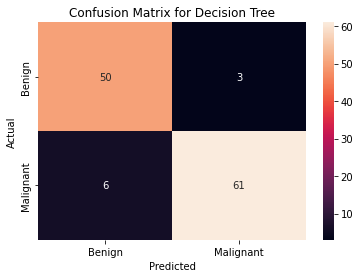

Naive Bayes: Accuracy: 0.983
Classification Report for Naive Bayes:
               precision    recall  f1-score   support

         0.0       0.96      1.00      0.98        53
         1.0       1.00      0.97      0.98        67

    accuracy                           0.98       120
   macro avg       0.98      0.99      0.98       120
weighted avg       0.98      0.98      0.98       120




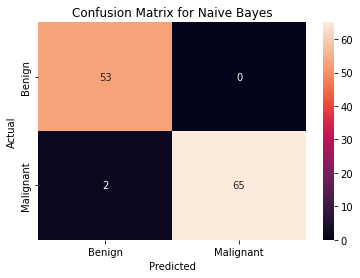

Support Vector Machine: Accuracy: 0.975
Classification Report for Support Vector Machine:
               precision    recall  f1-score   support

         0.0       0.96      0.98      0.97        53
         1.0       0.98      0.97      0.98        67

    accuracy                           0.97       120
   macro avg       0.97      0.98      0.97       120
weighted avg       0.98      0.97      0.98       120




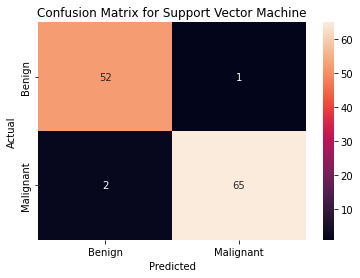

GBM: Accuracy: 0.967
Classification Report for GBM:
               precision    recall  f1-score   support

         0.0       0.95      0.98      0.96        53
         1.0       0.98      0.96      0.97        67

    accuracy                           0.97       120
   macro avg       0.97      0.97      0.97       120
weighted avg       0.97      0.97      0.97       120




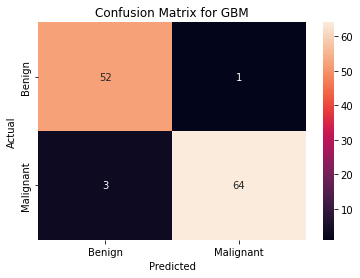

XGBoost: Accuracy: 0.983
Classification Report for XGBoost:
               precision    recall  f1-score   support

         0.0       0.96      1.00      0.98        53
         1.0       1.00      0.97      0.98        67

    accuracy                           0.98       120
   macro avg       0.98      0.99      0.98       120
weighted avg       0.98      0.98      0.98       120




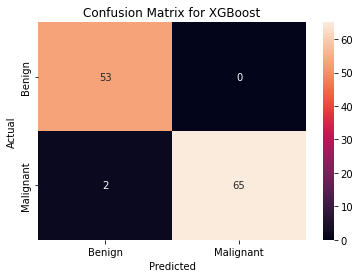

MLP: Accuracy: 0.983
Classification Report for MLP:
               precision    recall  f1-score   support

         0.0       0.98      0.98      0.98        53
         1.0       0.99      0.99      0.99        67

    accuracy                           0.98       120
   macro avg       0.98      0.98      0.98       120
weighted avg       0.98      0.98      0.98       120




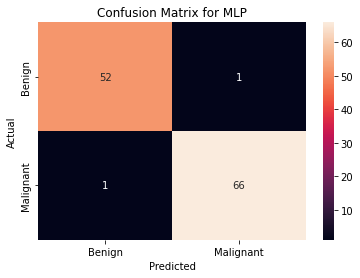

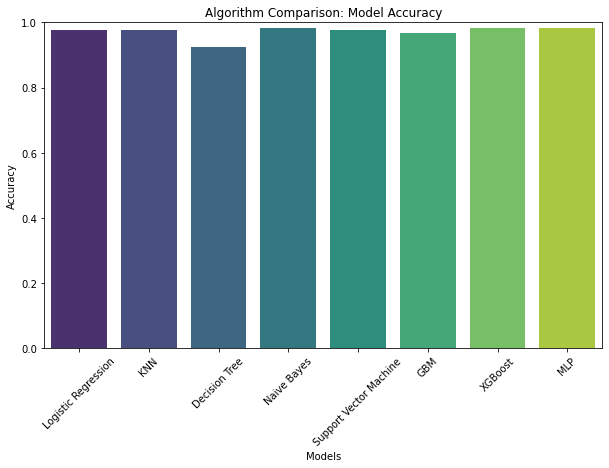

In [63]:
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_val_score

# Prepare models
models = [
    ('Logistic Regression', LogisticRegression(solver='liblinear')),
    ('KNN', KNeighborsClassifier()),
    ('Decision Tree', DecisionTreeClassifier()),
    ('Naive Bayes', GaussianNB()),
    ('Support Vector Machine', SVC()),
    ('GBM', GradientBoostingClassifier()),
    ('XGBoost', xgb.XGBClassifier(eval_metric='mlogloss')),
    ('MLP', MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=500))
]

# Prepare lists to store results and names
results = []
names = []

# Evaluate each model in turn
for name, model in models:
    # Train the model using training data (SMOTE for handling imbalance)
    model.fit(X_train_rfe, y_train_rfe)

    # Predict on the test set
    y_pred = model.predict(X_test_rfe)

    # Accuracy score
    accuracy = model.score(X_test_rfe, y_test_rfe)
    results.append(accuracy)
    names.append(name)
    print(f"{name}: Accuracy: {accuracy:.3f}")
    
    # Classification report
    print(f"Classification Report for {name}:\n", classification_report(y_test, y_pred))
    print()

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt="d", 
                xticklabels=['Benign', 'Malignant'], 
                yticklabels=['Benign', 'Malignant'])
    plt.title(f'Confusion Matrix for {name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

# Bar plot for algorithm comparison (accuracies of models)
plt.figure(figsize=(10, 6))
sns.barplot(x=names, y=results, palette='viridis')
plt.title('Algorithm Comparison: Model Accuracy')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.ylim(0, 1)  # Limiting y-axis from 0 to 1 for accuracy percentage
plt.xticks(rotation=45)  # Rotate model names for better readability
plt.show()

# Prediction Output

## Baseline Data

In [64]:
# Dictionary to store predictions for each model
test_predictions = {}

# Loop through each model to train and make predictions
for name, model in models:
    # Train the model
    model.fit(X_train_smote, y_train_smote)

    # Predict on the test set
    y_pred = model.predict(X_test)

    # Store predictions in the dictionary
    test_predictions[name] = y_pred

# Convert the predictions dictionary into a DataFrame
predictions_df = pd.DataFrame(test_predictions)

# Add the actual values for comparison
predictions_df['Actual'] = y_test

# Reorder the columns to put the 'Actual' value in the first column
predictions_df = predictions_df[['Actual'] + [col for col in predictions_df.columns if col != 'Actual']]

# Mapping to rename class labels
label_mapping = {0: 'Benign', 1: 'Malignant'}

# Rename the values in the DataFrame using the mapping
predictions_df = predictions_df.replace(label_mapping)

# Display the predictions DataFrame
print("Table of Predictions:")
predictions_df

Table of Predictions:


,Actual,Logistic Regression,KNN,Decision Tree,Naive Bayes,Support Vector Machine,GBM,XGBoost,MLP
0,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant
1,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign
2,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant
3,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant
4,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant
...,...,...,...,...,...,...,...,...,...
115,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant
116,Malignant,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign
117,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign
118,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign


## Top 5 Feature Importance Data

In [65]:
# Dictionary to store predictions for each model
test_predictions_top5 = {}

# Loop through each model to train and make predictions
for name, model in models:
    # Train the model
    model.fit(X_train_top5_smote, y_train_top5_smote)

    # Predict on the test set
    y_pred = model.predict(X_test_top5)

    # Store predictions in the dictionary
    test_predictions_top5[name] = y_pred

# Convert the predictions dictionary into a DataFrame
predictions_df_top5 = pd.DataFrame(test_predictions_top5)

# Add the actual values for comparison
predictions_df_top5['Actual'] = y_test

# Reorder the columns to put the 'Actual' value in the first column
predictions_df_top5 = predictions_df_top5[['Actual'] + [col for col in predictions_df_top5.columns if col != 'Actual']]

# Mapping to rename class labels
label_mapping = {0: 'Benign', 1: 'Malignant'}

# Rename the values in the DataFrame using the mapping
predictions_df_top5 = predictions_df_top5.replace(label_mapping)

# Display the predictions DataFrame
print("Table of Predictions:")
predictions_df_top5

Table of Predictions:


,Actual,Logistic Regression,KNN,Decision Tree,Naive Bayes,Support Vector Machine,GBM,XGBoost,MLP
0,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant
1,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign
2,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant
3,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant
4,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant
...,...,...,...,...,...,...,...,...,...
115,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant
116,Malignant,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign
117,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign
118,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign


## RFE Data

In [66]:
# Dictionary to store predictions for each model
test_predictions_rfe = {}

# Loop through each model to train and make predictions
for name, model in models:
    # Train the model
    model.fit(X_train_rfe, y_train_rfe)

    # Predict on the test set
    y_pred = model.predict(X_test_rfe)

    # Store predictions in the dictionary
    test_predictions_rfe[name] = y_pred

# Convert the predictions dictionary into a DataFrame
predictions_df_rfe = pd.DataFrame(test_predictions_rfe)

# Add the actual values for comparison
predictions_df_rfe['Actual'] = y_test

# Reorder the columns to put the 'Actual' value in the first column
predictions_df_rfe = predictions_df_rfe[['Actual'] + [col for col in predictions_df_rfe.columns if col != 'Actual']]

# Mapping to rename class labels
label_mapping = {0: 'Benign', 1: 'Malignant'}

# Rename the values in the DataFrame using the mapping
predictions_df_rfe = predictions_df_rfe.replace(label_mapping)

# Display the predictions DataFrame
print("Table of Predictions:")
predictions_df_rfe

Table of Predictions:


,Actual,Logistic Regression,KNN,Decision Tree,Naive Bayes,Support Vector Machine,GBM,XGBoost,MLP
0,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant
1,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign
2,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant
3,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant
4,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant
...,...,...,...,...,...,...,...,...,...
115,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant,Malignant
116,Malignant,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign
117,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign
118,Benign,Benign,Benign,Malignant,Benign,Benign,Benign,Benign,Benign


## Save in Excel File

In [67]:
pip install openpyxl

Note: you may need to restart the kernel to use updated packages.


In [68]:
# Specify the path where the Excel file will be saved
output_path1 = (r"C:\Users\amiru\Desktop\Data Scientist Final Project\model_predictions_baseline.xlsx")
output_path2 = (r"C:\Users\amiru\Desktop\Data Scientist Final Project\model_predictions_top5.xlsx")
output_path3 = (r"C:\Users\amiru\Desktop\Data Scientist Final Project\model_predictions_rfe.xlsx")

# Save the predictions DataFrame to the specified path
predictions_df.to_excel(output_path1, index=False, engine='openpyxl')
predictions_df_top5.to_excel(output_path2, index=False, engine='openpyxl')
predictions_df_rfe.to_excel(output_path3, index=False, engine='openpyxl')


# Confirmation message
print(f"Predictions table has been saved to '{output_path1}'.")
print(f"Predictions table has been saved to '{output_path2}'.")
print(f"Predictions table has been saved to '{output_path3}'.")

Predictions table has been saved to 'C:\Users\amiru\Desktop\Data Scientist Final Project\model_predictions_baseline.xlsx'.
Predictions table has been saved to 'C:\Users\amiru\Desktop\Data Scientist Final Project\model_predictions_top5.xlsx'.
Predictions table has been saved to 'C:\Users\amiru\Desktop\Data Scientist Final Project\model_predictions_rfe.xlsx'.


## End of Notebook